# **Interedition:**

In our last work, we introduced a model that predicts critic scores for PC/PS games using features such as sales information, developer, publisher, counting score, user score, and more. In this work, we aim to improve this model.

We will achieve this by manipulating the data and tuning the model parameters.

In our last work, we observed that the features "Year of Release" and "Genre" have a significant effect on the critic score.

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import warnings
warnings.filterwarnings("ignore")

data = pd.read_csv('./Dataset/Cleaned Data 2.csv')
original_data = data  # Keeping the original dataset as well in case we would need to use the removed columns.
data.head()
rating_order = {
    'AO': 0,     # Adults Only
    'RP': 1,     # Rating Pending
    'K-A': 2,    # Kids to Adults (similar to 'E')
    'E': 2,      # Everyone
    'E10+': 3,   # Everyone 10+
    'T': 4,      # Teen
    'M': 5       # Mature
}
data['Rating'] = data['Rating'].map(rating_order).fillna(0)
data['Year_of_Release'] = data['Year_of_Release'].round().astype(int)
original_data = data.copy()
duplicate_data = data.copy()
duplicate_data['Genre'] = 'All_Genres'



data = pd.concat([data, duplicate_data], ignore_index=True)
original_data = pd.concat([data, duplicate_data], ignore_index=True)


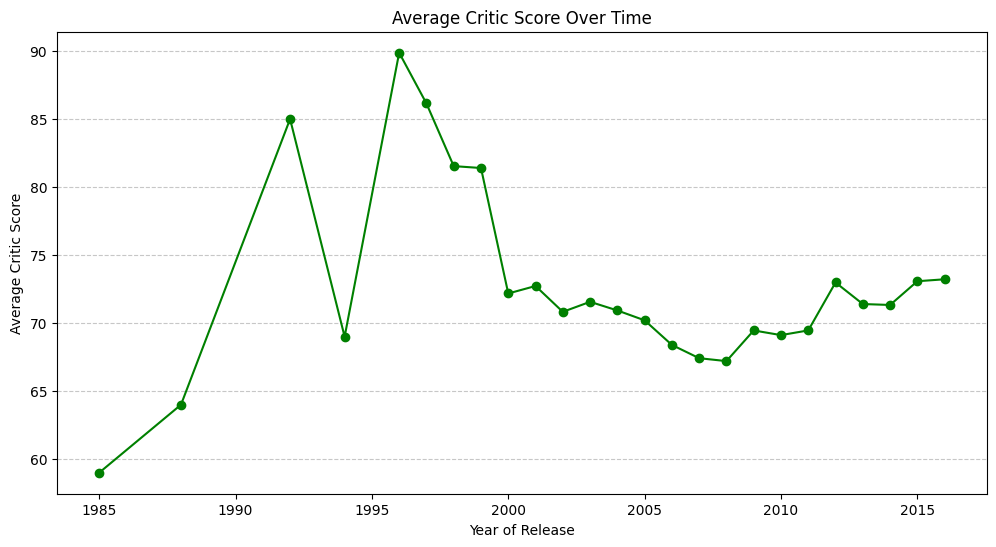

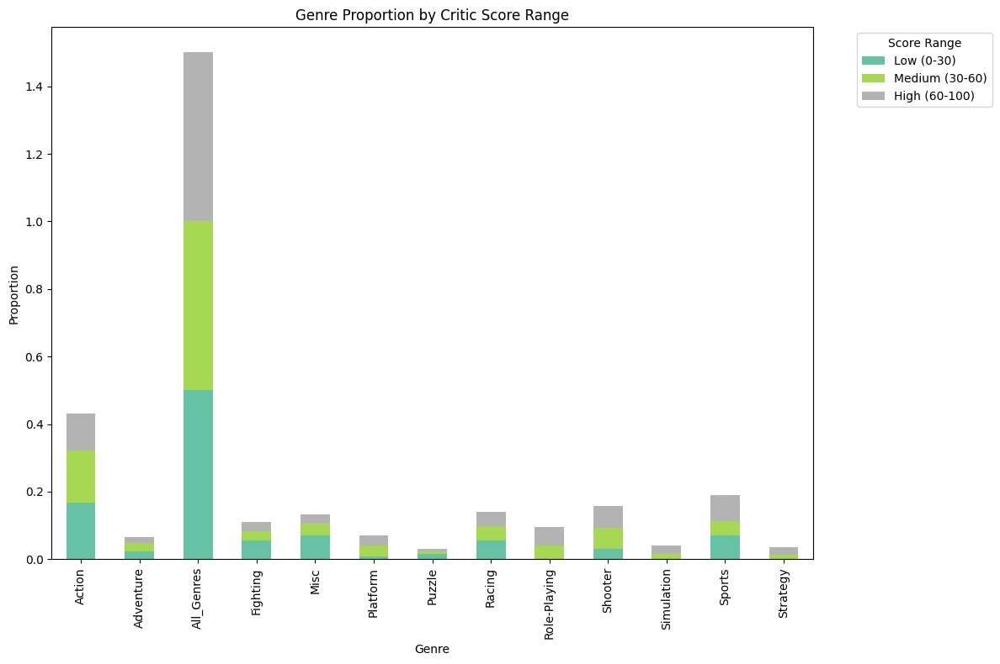

In [2]:
plt.figure(figsize=(12, 6))
average_score_by_year = data.groupby('Year_of_Release')['Critic_Score'].mean()
average_score_by_year.plot(kind='line', marker='o', color='green')
plt.title('Average Critic Score Over Time')
plt.xlabel('Year of Release')
plt.ylabel('Average Critic Score')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

import matplotlib.pyplot as plt
import pandas as pd

score_ranges = pd.cut(data['Critic_Score'], bins=[0, 30, 60, 100], labels=['Low (0-30)', 'Medium (30-60)', 'High (60-100)'])

genre_proportions = data.groupby(score_ranges)['Genre'].value_counts(normalize=True).unstack().T

genre_proportions.plot(kind='bar', stacked=True, figsize=(12, 8), colormap='Set2')
plt.title('Genre Proportion by Critic Score Range')
plt.xlabel('Genre')
plt.ylabel('Proportion')
plt.legend(title='Score Range', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

We can see that until the year 2000, the critic score is very noisy. From the year 2000 onward, the critic score becomes more consistent, likely due to technological improvements and the fact that games became more accessible to users. Our model aims to predict the critic score for modern games, so we will remove all samples from before the year 2000

Moreover, we can see that the distribution of critic scores varies slightly across different genres. To address this, we will split the model into genre-specific models. For each genre, we will create a separate model (using the same architecture) trained only on data from that genre to improve predictions for that specific genre.

In addition, the next table shows that there is a correlation among the sales features. By encoding these features into a single combined feature, we may improve our model. This approach simplifies the data and helps the model learn important patterns more efficiently.

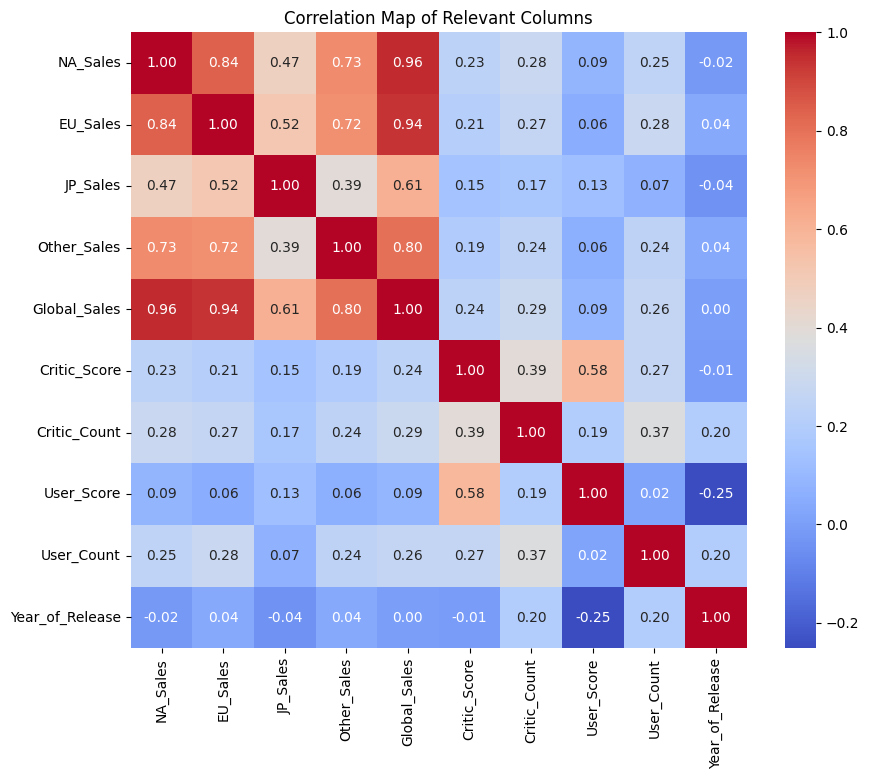

In [3]:
relevant_columns = ['NA_Sales', 'EU_Sales', 'JP_Sales', 'Other_Sales', 'Global_Sales',
                    'Critic_Score', 'Critic_Count', 'User_Score', 'User_Count', 'Year_of_Release']

correlation_matrix = data[relevant_columns].corr()

plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", cbar=True, square=True)
plt.title("Correlation Map of Relevant Columns")
plt.show()

# **Filter Data Funcions**

In [4]:
def filter_data_by_genre(data, genre):
  data = data[data['Genre'] == genre]
  data = data.drop(columns=['Genre'])
  return data

def filter_data_by_year(data, start_year, end_year):
  data = data[data['Year_of_Release'] >= start_year]
  data = data[data['Year_of_Release'] < end_year]
  return data

def handle_categorical_columns(data):
  categorical_columns = ['Name']
  data = pd.get_dummies(data, columns=['Developer', 'Publisher'], drop_first=True)
  data = data.drop(columns=categorical_columns)
  return data

# **PCA function for sales features**

In [5]:
def get_data_after_pca_sales_features(data, features,
                                      reduce_to_size, features_to_drop):
  from sklearn.decomposition import PCA
  from sklearn.preprocessing import StandardScaler, MinMaxScaler
  scaler = StandardScaler()
  sales = data[features]
  data_scaled = scaler.fit_transform(sales)

  # Apply PCA
  pca = PCA(n_components=reduce_to_size)
  data_pca = pca.fit_transform(data_scaled)

  # Convert the result back to a DataFrame
  data_pca_df = pd.DataFrame(data_pca, columns=[f'PC{i+1}' for i in range(data_pca.shape[1])])
  data_fs = pd.concat([data, data_pca_df], axis=1)

  data_fs.drop(columns=features_to_drop)

  # Fill missing values (example: median for numeric, mode for categorical)
  return data_fs.fillna(data_fs.median(numeric_only=True))


# **Model**

In [6]:
def split_data(data):
  from sklearn.model_selection import train_test_split
  from sklearn.preprocessing import StandardScaler
  # Split features and target
  X = data.drop(columns=['Critic_Score'])
  y = data['Critic_Score']

  # Feature scaling for numeric columns
  scaler = StandardScaler()
  X_scaled = scaler.fit_transform(X)
  X_scaled_df = pd.DataFrame(X_scaled, columns=X.columns)
  X_scaled_df.columns = X_scaled_df.columns.str.replace(r'[<>,"\'\[\]\(\)\s]', '_', regex=True)

  # Split into training and test sets
  return train_test_split(X_scaled_df, y, test_size=0.2, random_state=42)

def fit_model(X_train, y_train):
  from sklearn.model_selection import train_test_split
  import xgboost as xgb
  model = xgb.XGBRegressor(
    random_state=42,
    learning_rate=0.05,
    n_estimators=1200,  # Number of boosting rounds
    max_depth=4,       # Maximum tree depth
    subsample=0.9,     # Subsample ratio of the training data
    colsample_bytree=0.5  # Subsample ratio of columns
  )
  model.fit(X_train, y_train)
  print("Model training complete.")
  return model

def evaluate_model(model, X_test, y_test):
  from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
  # Make predictions
  y_pred = model.predict(X_test)
  mse = mean_squared_error(y_test, y_pred)
  rmse = np.sqrt(mse)
  mae = mean_absolute_error(y_test, y_pred)
  r2 = r2_score(y_test, y_pred)

  return {"mse": mse, "rmse": rmse, "mae": mae, "r2": r2}, y_pred
  print(f"Model Performance Metrics:")
  print(f"RMSE: {rmse:.2f}k")
  print(f"MAE: {mae:.2f}k")
  print(f"R2 Score: {r2:.3f}")


# **Method:**
As explained previously, we generated models for each year range and for each combination of year range and PCA configuration. We tuned the hyperparameters of the model and ran the split data on the same models. We kept the original data with the name All_Genres for later comparison.

In [7]:
from __future__ import generator_stop
def get_filter_data_for_model(date, genrem, start_year, end_year, pca_params):
  filter_data = filter_data_by_genre(data, genre)
  filter_data = filter_data_by_year(filter_data, start_year, end_year)
  # Check if the filtered data is empty
  if filter_data.empty:
      return filter_data
  filter_data = handle_categorical_columns(filter_data)
  if pca_params == None:
    return filter_data
  filter_data = get_data_after_pca_sales_features(filter_data, *pca_params)
  return filter_data
years = [
          (2000, 2016),
          (2000, 2005),
          (2005, 2010),
          (2010, 2015),
          (2015, 2020),
        ]
pca_params = [
              ("no_pca", (None)),
              ("top_three_pca_sales",  (['NA_Sales', 'EU_Sales', 'Global_Sales'], 2, ['NA_Sales', 'EU_Sales', 'Global_Sales'])),
              ("all_sales_pca", (['NA_Sales', 'EU_Sales', 'JP_Sales', 'Other_Sales', 'Global_Sales'], 2, ['NA_Sales', 'EU_Sales', 'JP_Sales', 'Other_Sales', 'Global_Sales'])),
              ("top_tow_pca_sales",  (['NA_Sales', 'EU_Sales'], 1, ['NA_Sales', 'EU_Sales']))
              ]

genres = list(set(data['Genre']))
models_results = {}
MODELS = []
for genre in genres:
  models_results[genre] = []
index = 1
for genre in genres:
  for year in years:
    for pca_param in pca_params:
      if pca_param[1] == None:
        filter_data = get_filter_data_for_model(data, genre,
                                              year[0], year[1], None)
      else:
        filter_data = get_filter_data_for_model(data, genre,
                                              year[0], year[1], pca_param[1])
      if filter_data.empty:
        continue
      X_train, X_test, y_train, y_test = split_data(filter_data)
      model = fit_model(X_train, y_train)
      res, y_pred = evaluate_model(model, X_test, y_test)
      name = f"{pca_param[0]}", f"{year[0]}-{year[1]}"
      MODELS.append({'modele_data': (genre, model, X_train, X_test, y_train, y_test, y_pred), 'name': name})
      print(res)
      models_results[genre].append((f"{pca_param[0]}", f"{year[0]}-{year[1]}", res))
      print(f"complite {index}\ {len(genres) * len(years) * len(pca_params)}")
      index += 1



Model training complete.
{'mse': 65.39471435546875, 'rmse': 8.086699843290138, 'mae': 6.006677150726318, 'r2': 0.6348386406898499}
complite 1\ 260
Model training complete.
{'mse': 26.489179557336847, 'rmse': 5.146763988890188, 'mae': 2.717416709728455, 'r2': 0.6688562527590629}
complite 2\ 260
Model training complete.
{'mse': 26.66457598777663, 'rmse': 5.163775361862348, 'mae': 2.7458442302232378, 'r2': 0.6666636053385266}
complite 3\ 260
Model training complete.
{'mse': 28.020224571306358, 'rmse': 5.293413319523269, 'mae': 2.777634893910269, 'r2': 0.6497165137564636}
complite 4\ 260
Model training complete.
{'mse': 54.89584732055664, 'rmse': 7.409173187377701, 'mae': 5.721992015838623, 'r2': 0.571780264377594}
complite 5\ 260
Model training complete.
{'mse': 35.30798518272083, 'rmse': 5.9420522702784115, 'mae': 3.132968714979828, 'r2': 0.6752046633286588}
complite 6\ 260
Model training complete.
{'mse': 34.75473995686838, 'rmse': 5.895315085461368, 'mae': 3.096604362863009, 'r2': 0.68

# **Results of the basic pipeline**

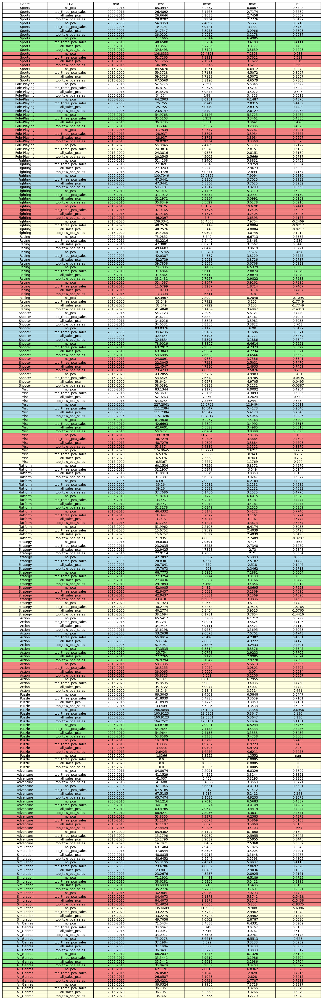

In [8]:
import pandas as pd
import ast
import matplotlib.pyplot as plt
import math
def display_csv_as_table(filepath):
    data = pd.read_csv(filepath)
    data = data.round(4)

    # Define colors for year ranges
    def get_row_color(year):
        if year == '2000-2005':
            return 'lightblue'
        elif year == '2005-2010':
            return 'lightgreen'
        elif year == '2010-2015':
            return 'lightcoral'
        elif year == '2015-2020':
            return 'lightyellow'
        elif year == '2020-2025':
            return 'lightpink'
        else:
            return 'white'

    # Create a figure and axis
    fig, ax = plt.subplots(figsize=(18, 24))  # Adjust size for readability
    ax.axis('tight')
    ax.axis('off')

    # Create the table
    table = ax.table(cellText=data.values, colLabels=data.columns, cellLoc='center', loc='center')

    # Set row colors
    for i, year in enumerate(data['Year']):
        color = get_row_color(year)
        for j in range(len(data.columns)):
            table[(i + 1, j)].set_facecolor(color)

    plt.show()

def show_consolidated_results(models_results):
    # Extract and structure the data
    data_list = []
    for genre, results in models_results.items():
        if len(results) == 0:
            continue
        for pca, year, metrics in results:
            # if math.isnan(metrics['r2']):
            #   continue
            # metrics_dict = ast.literal_eval(metrics)  # Convert string dictionary to actual dictionary
            row = {'Genre': genre, 'PCA': pca, 'Year': year, **metrics} #**metrics_dict}
            data_list.append(row)
    # Create a consolidated DataFrame
    consolidated_df = pd.DataFrame(data_list)

    # consolidated_df = consolidated_df[consolidated_df['r2'] >= 0.7]
    # Save to a CSV file
    consolidated_df.to_csv('./Dataset/consolidated_results.csv', index=False)

    # Display the consolidated table
    display_csv_as_table('./Dataset/consolidated_results.csv')
    return data_list

# Example usage
data_list = show_consolidated_results(models_results)


**In the table above, the results for all models across different datasets and PCA configurations are not conclusive**.

Performance varies, with some configurations showing improvement while others do not.
Our hypothesis is that our model performs well but struggles to provide consistent results due to insufficient data. To gain deeper insight, we will present the next table.

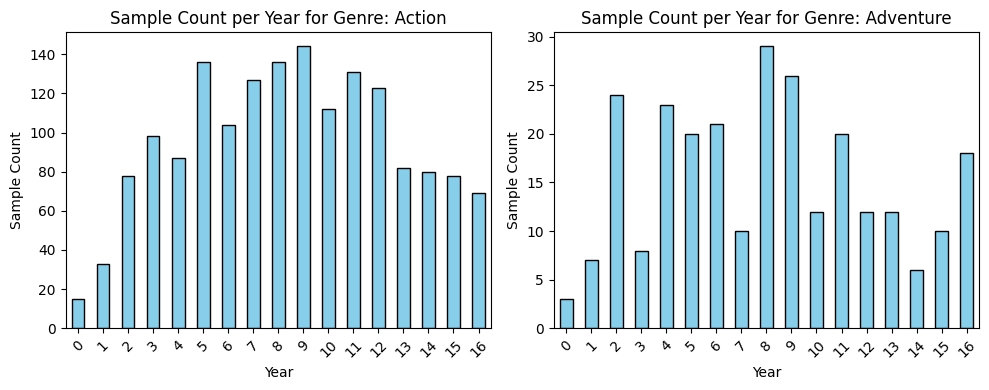

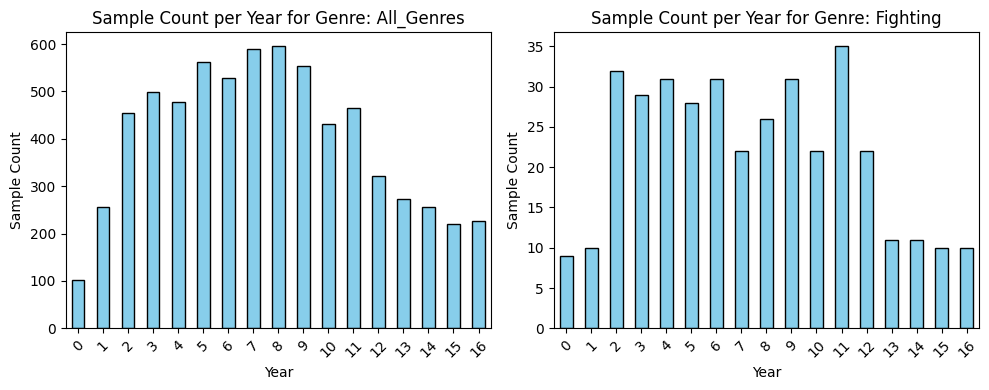

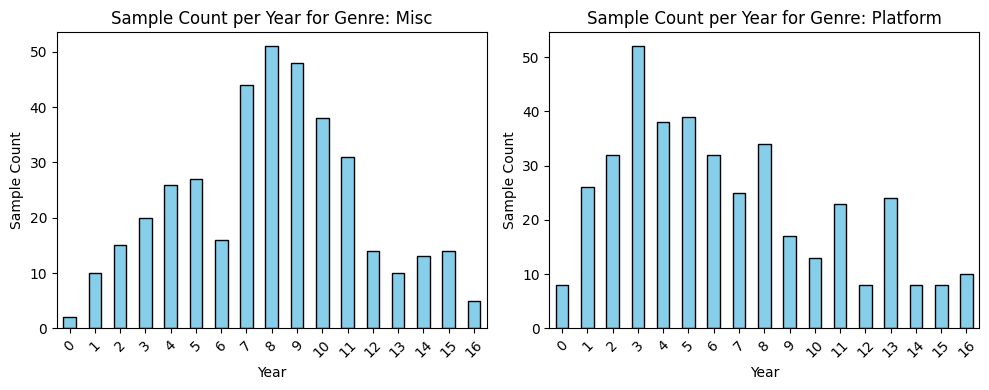

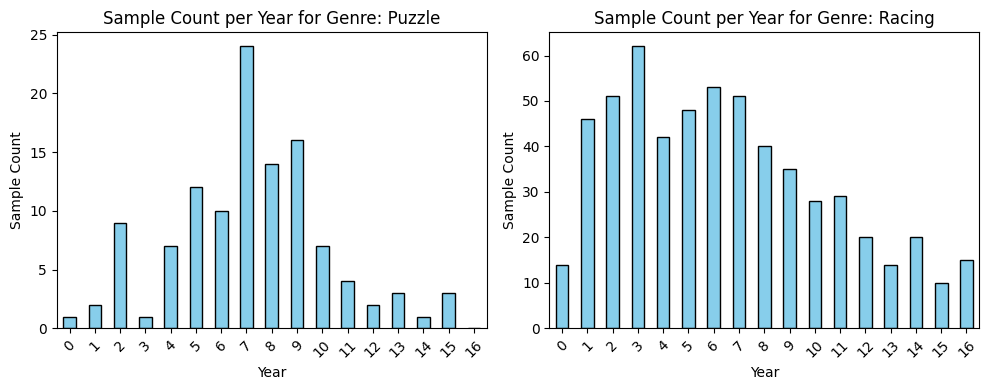

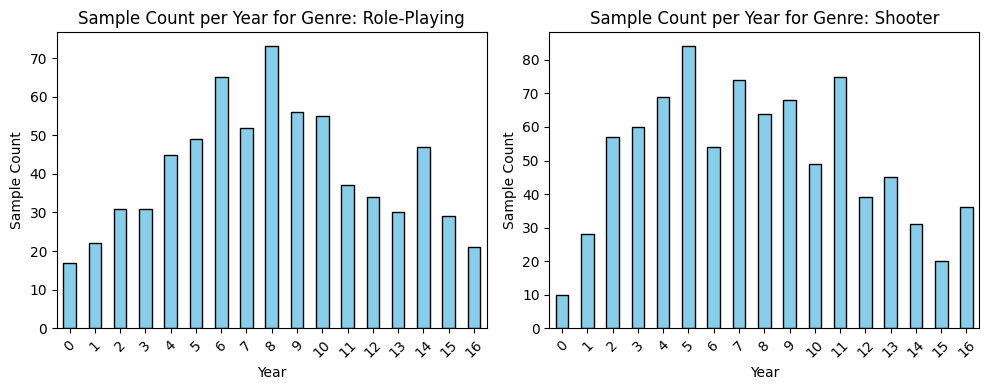

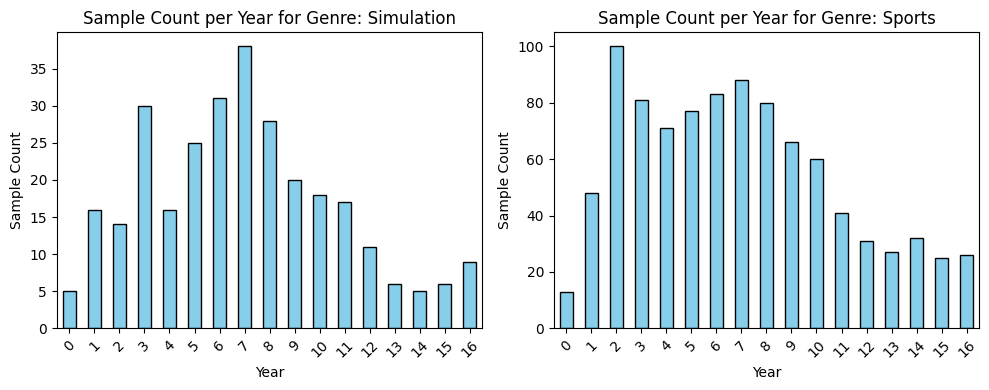

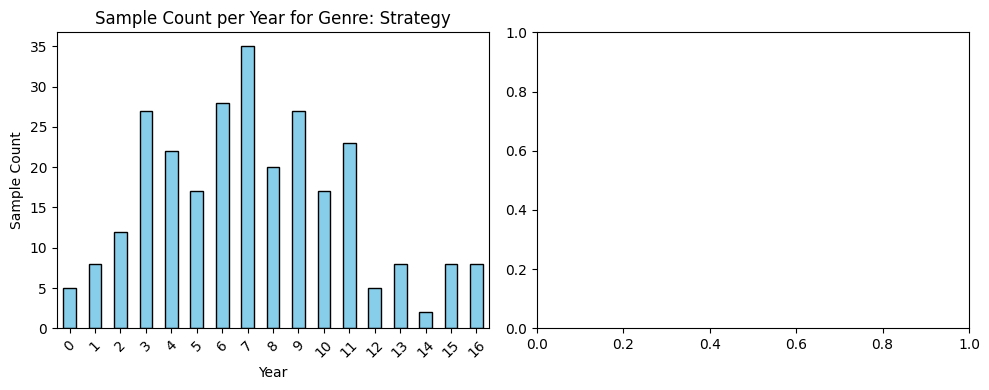

In [9]:
import matplotlib.pyplot as plt
import pandas as pd

# Filter valid data
df = original_data.copy()
df['Year_of_Release'] = pd.to_numeric(df['Year_of_Release'], errors='coerce')
df = df[(df['Year_of_Release'] >= 2000) & (df['Year_of_Release'] <= 2025)]  # Filter years
df = df.drop_duplicates()

# Group and count
genre_year_counts = df.groupby(['Genre', 'Year_of_Release']).size().unstack(fill_value=0)

# Create a subplot for every two genres
genres = genre_year_counts.index.tolist()

for i in range(0, len(genres), 2):  # Iterate two genres at a time
    fig, axes = plt.subplots(1, 2, figsize=(10, 4))  # Create a figure with 1 row, 2 columns

    for j, genre in enumerate(genres[i:i+2]):  # Loop through the two genres
        ax = axes[j]  # Get the current axis
        genre_year_counts.loc[genre].plot(kind='bar', ax=ax, color='skyblue', edgecolor='black')

        # Customizing the plot
        ax.set_title(f'Sample Count per Year for Genre: {genre}')
        ax.set_xlabel('Year')
        ax.set_ylabel('Sample Count')
        ax.set_xticklabels(ax.get_xticks(), rotation=45)

    # Adjust layout
    plt.tight_layout()

    # Show the plots
    plt.show()
genre_year_counts = genre_year_counts.reset_index()

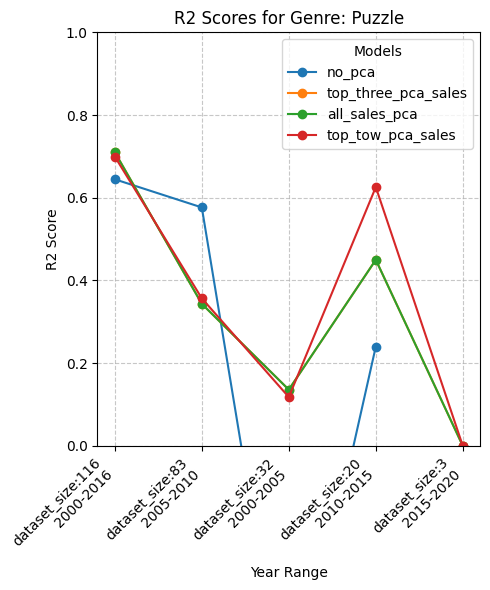

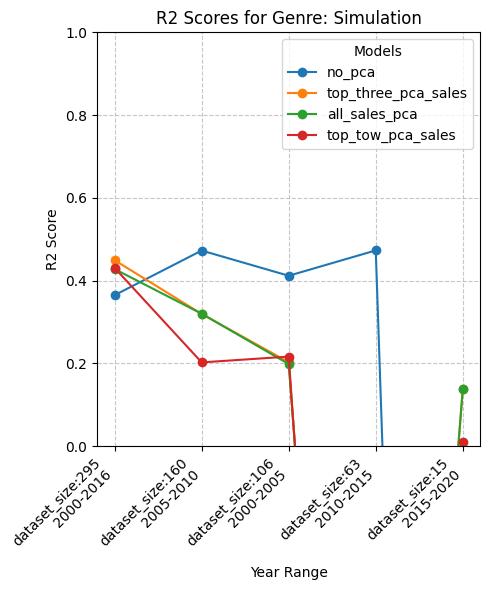

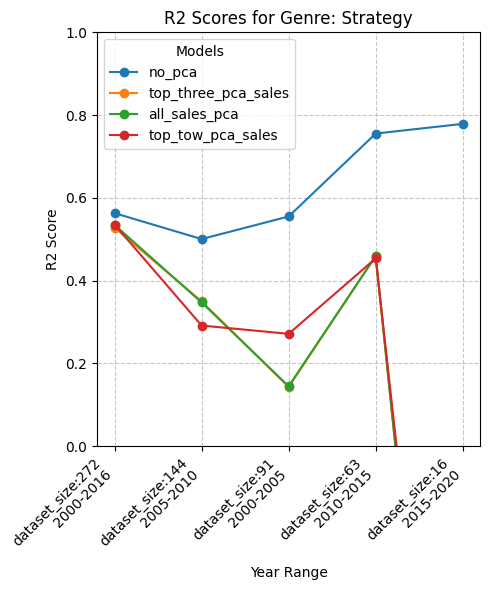

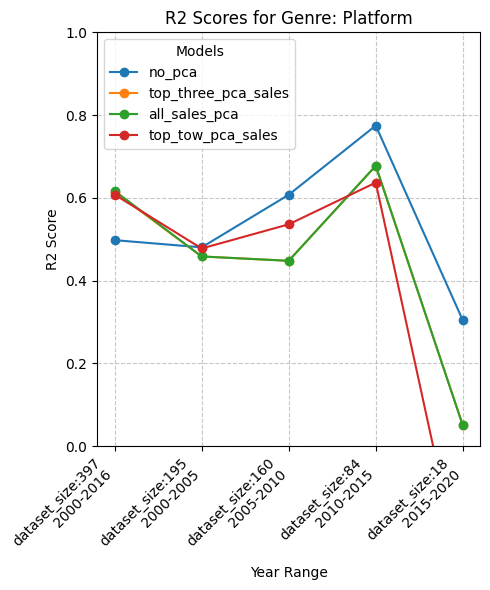

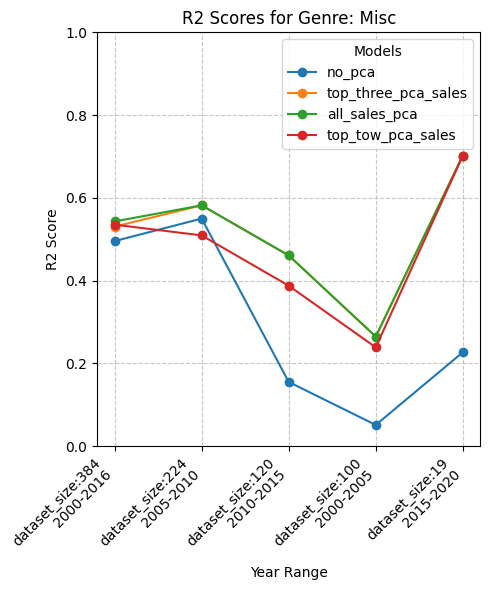

...

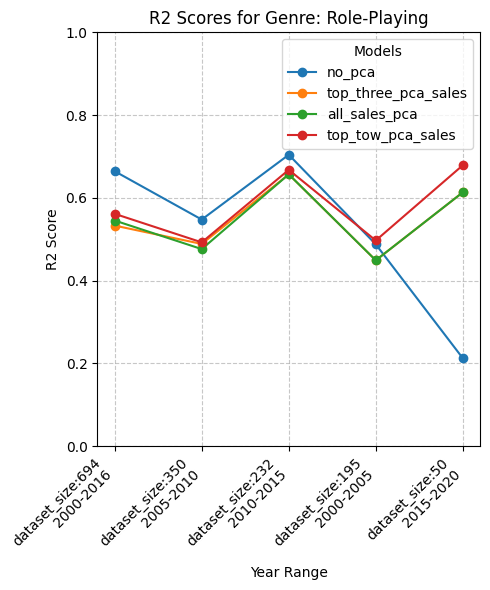

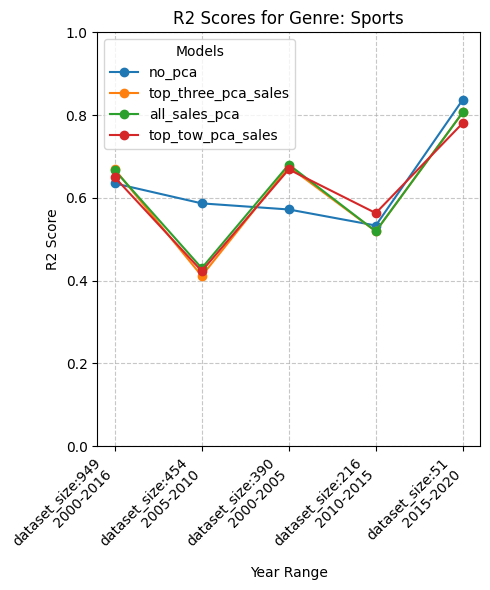

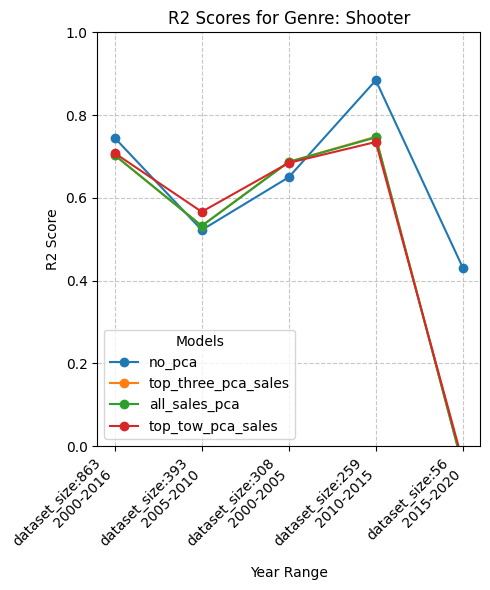

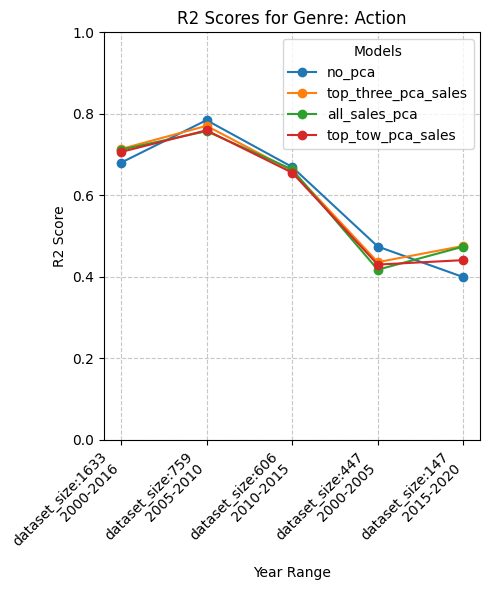

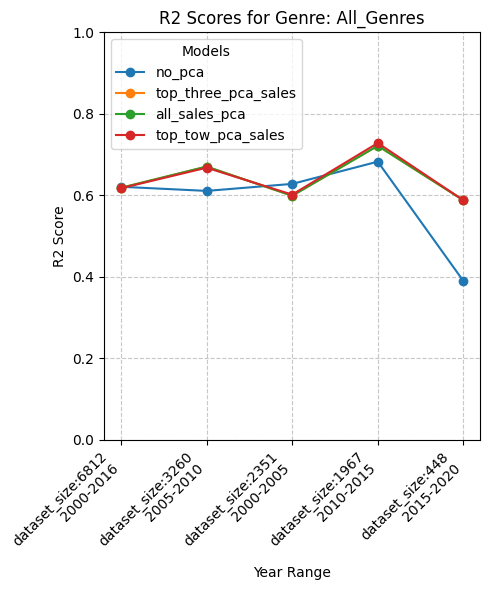

In [10]:
import matplotlib.pyplot as plt
from collections import defaultdict

genre_years_2_dataset_size = {}
for genre in genres:
    for year in years:
        start_year, end_year = year
        columns_in_range = \
         [col for col in genre_year_counts.columns if isinstance(col, int) and \
                                                start_year <= col <= end_year]
        genre_row = genre_year_counts[genre_year_counts['Genre'] == genre]
        sum_values = genre_row[columns_in_range].sum(axis=1).values[0]
        genre_years_2_dataset_size[(genre, f'{start_year}-{end_year}')] = sum_values

results = {}
for item in data_list:
    genre = item['Genre']
    year_range = item['Year']
    if genre not in results:
        results[genre] = {}
    if year_range not in results[genre]:
        results[genre][year_range] = {}
    results[genre][year_range][item['PCA']] = {'r2': item['r2']}
data_for_plot = []
for item in data_list:
    genre = item['Genre']
    size = genre_years_2_dataset_size[(genre, item['Year'])]
    msg = f'dataset_size:{size}\n' + item['Year']
    year_range = msg
    data_for_plot += [{"genre": genre,
                       "year_range": msg,
                       "model_results": results[genre][item['Year']]}]
sorted_data = sorted(
    data_for_plot,
    key=lambda x: (int(x['year_range'].split('\n')[0].split(':')[1]), x['genre'])  # Extract dataset size and genre
)

genre_data = {}
# Organize data by genre and year range using regular dict
for item in sorted_data:
    genre = item["genre"]
    year_range = item["year_range"]
    # Initialize dictionary for the genre if it doesn't exist
    if genre not in genre_data:
        genre_data[genre] = {}
    # Initialize dictionary for the year range if it doesn't exist
    if year_range not in genre_data[genre]:
        genre_data[genre][year_range] = {}
    for model, results in item["model_results"].items():
        genre_data[genre][year_range][model] = results["r2"]




for genre, year_data in genre_data.items():
    plt.figure(figsize=(5, 6))
    # Sort the year_ranges by their dataset size
    sorted_year_ranges = sorted(
        year_data.items(),
        key=lambda x: int(x[0].split('dataset_size:')[1].split('\n')[0]),
        reverse=True
    )

    # Extract year ranges in the correct order
    year_ranges_sorted = [year_range for year_range, _ in sorted_year_ranges]

    models = ['no_pca', 'top_three_pca_sales', 'all_sales_pca', 'top_tow_pca_sales']

    # Plot for each model
    for model in models:
        r2_scores = [year_data[year][model] for year in year_ranges_sorted]
        plt.plot(year_ranges_sorted, r2_scores, label=model, marker='o')

    plt.title(f'R2 Scores for Genre: {genre}')
    plt.xlabel('Year Range')
    plt.ylabel('R2 Score')
    plt.legend(title="Models")
    plt.xticks(rotation=45, ha='right')
    plt.grid(True, linestyle='--', alpha=0.7)
    plt.tight_layout()
    plt.ylim(0, 1)  # Force y-axis to show full range
    plt.show()


**First, we successfully improved the model for many genres and managed to reduce feature dimensions!**

**In the All_Genres table, which represents the original data, we reduced the feature vector while mostly improving the results—an impressive achievement in itself.**

However, looking at individual genres reveals inconsistent performance: some genres show improved results, while others show deterioration.
We hypothesize two potential explanations:

1. Model performance is data-dependent. With limited data, results are poor; more data consistently improves performance.
Genres differ in pattern clarity:

2. Some genres have more distinct data patterns
Easier genres might mask performance issues in more challenging genres when analyzing the aggregate (All_Genres) dataset

# **Error Analysis**

To decide which model to use, we considered the pros and cons of each.

Each model performs well in some scenarios and poorly in others. Due to the extensive amount of models, we will not present the error analysis tables for all models across all datasets. Instead, we will focus on the model that uses PCA with the top three sales features. This model performs well in most cases while achieving effective feature reduction.

We will evaluate this model across all data variations to gain deeper insights into the data and its behavior.

# **A. Features Importance**
This plot is essential for error analysis as it identifies which features significantly impact the model's predictions. This enables targeted investigation into whether high-importance features are contributing to errors or if low-importance features are adding noise, thereby guiding improvements in feature selection and model development.

Sports_2000-2016_top_three_pca_sales


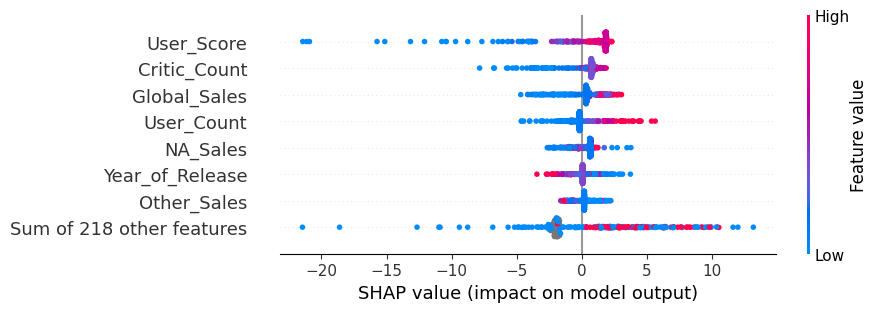

Sports_2000-2005_top_three_pca_sales


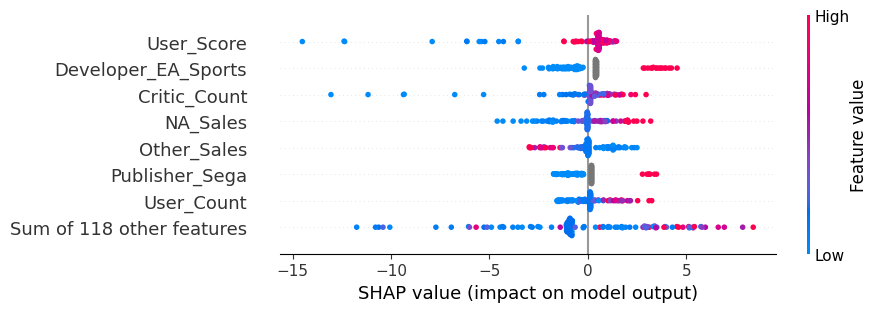

Sports_2005-2010_top_three_pca_sales


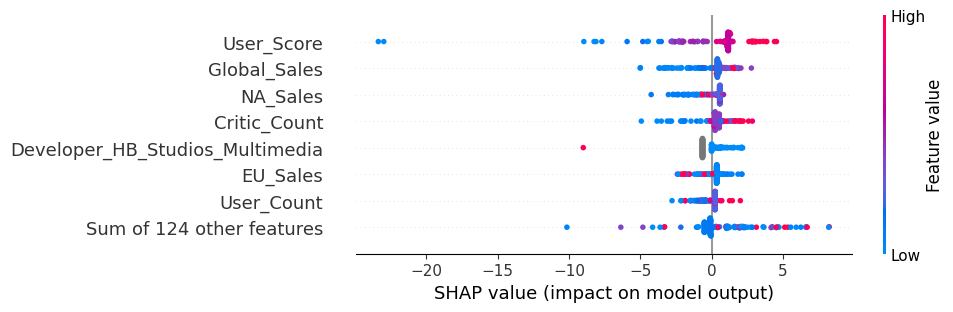

Sports_2010-2015_top_three_pca_sales


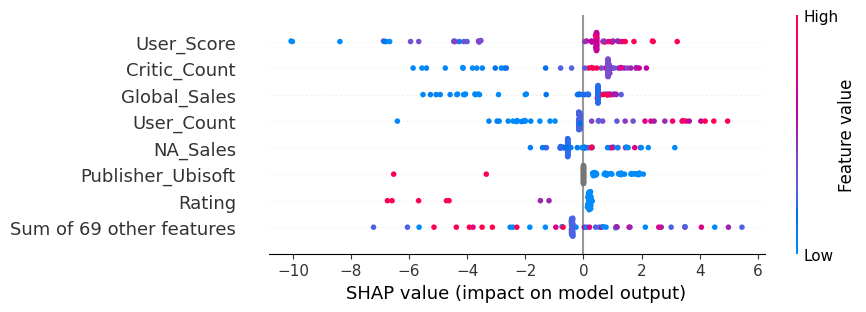

Sports_2015-2020_top_three_pca_sales


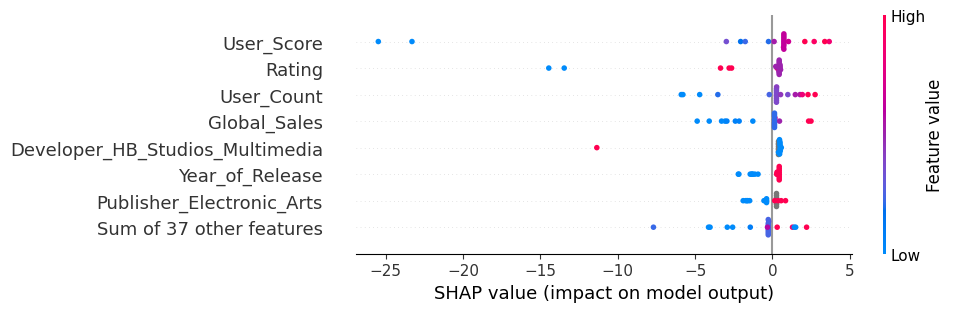

Role-Playing_2000-2016_top_three_pca_sales


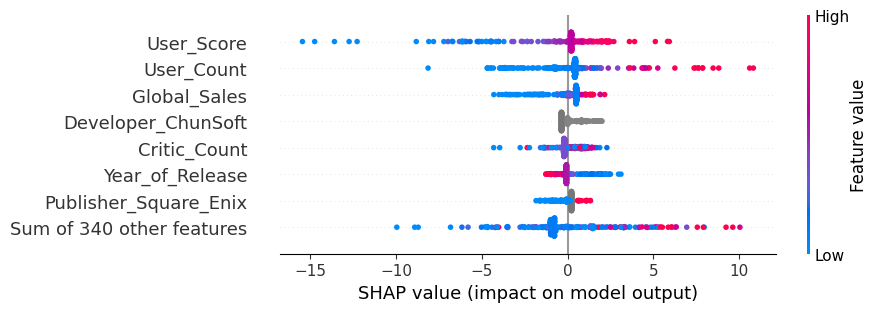

Role-Playing_2000-2005_top_three_pca_sales


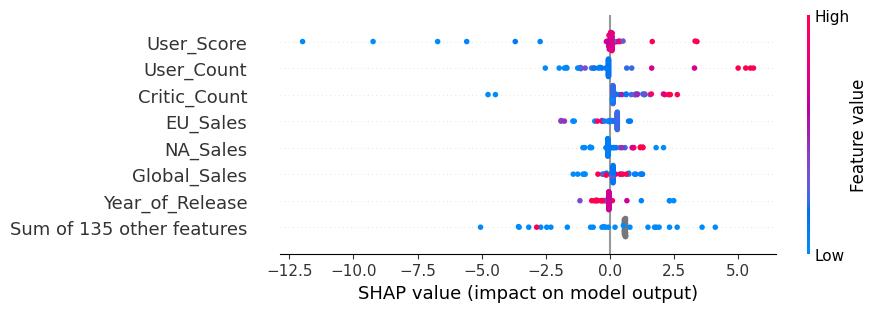

Role-Playing_2005-2010_top_three_pca_sales


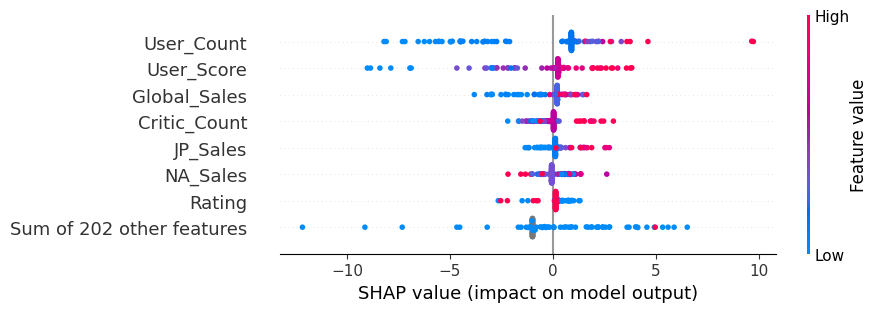

Role-Playing_2010-2015_top_three_pca_sales


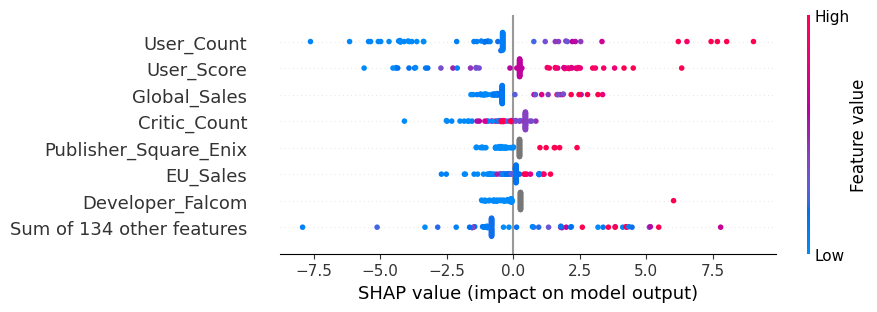

Role-Playing_2015-2020_top_three_pca_sales


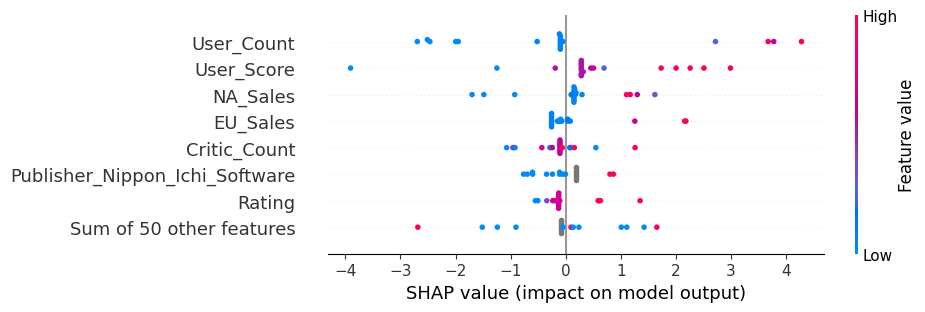

Fighting_2000-2016_top_three_pca_sales


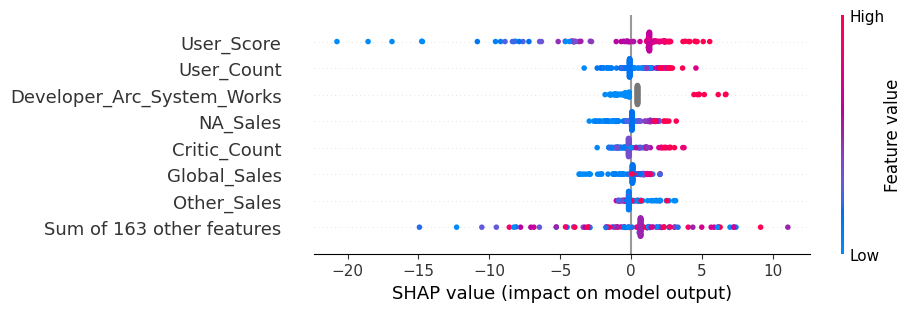

Fighting_2000-2005_top_three_pca_sales


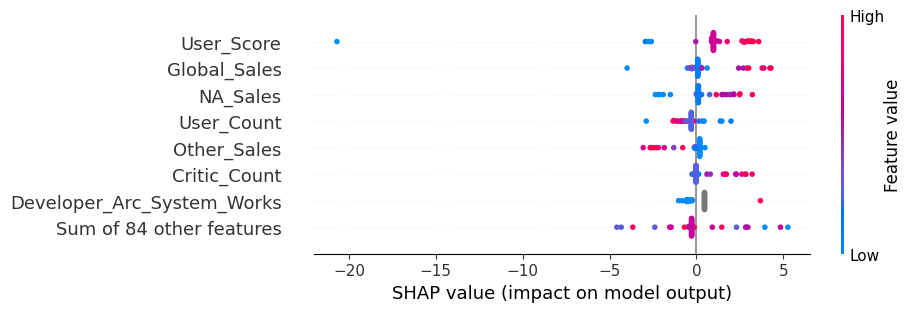

Fighting_2005-2010_top_three_pca_sales


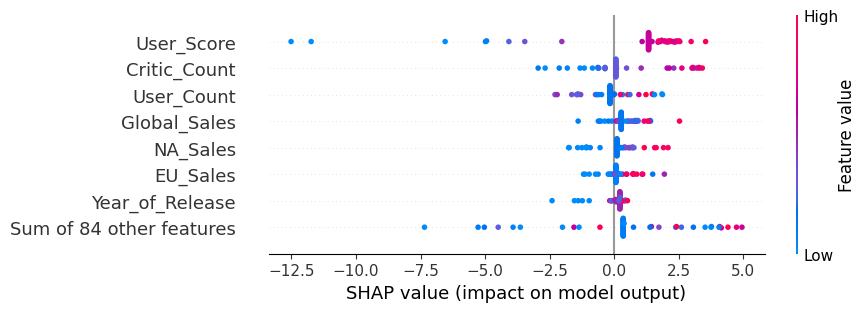

Fighting_2010-2015_top_three_pca_sales


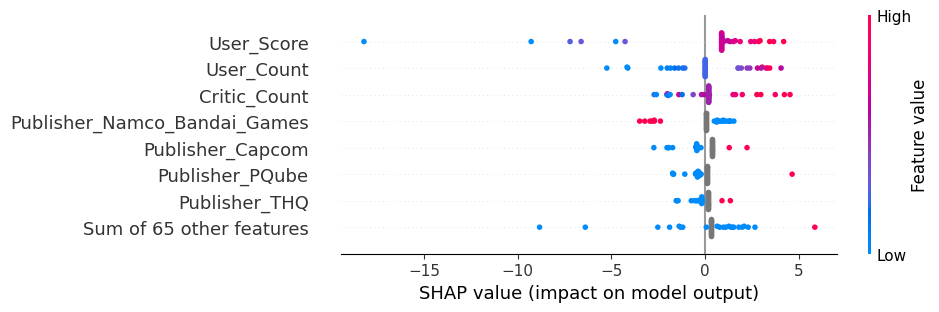

Fighting_2015-2020_top_three_pca_sales


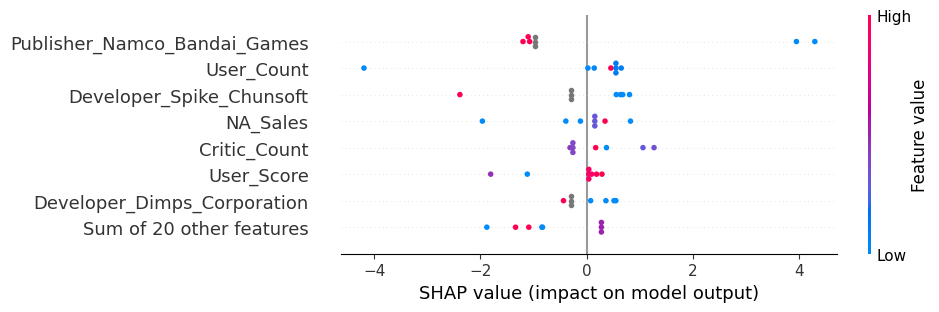

Racing_2000-2016_top_three_pca_sales


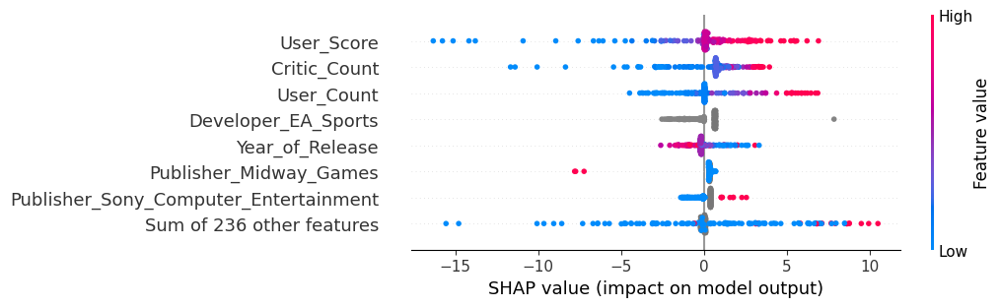

Racing_2000-2005_top_three_pca_sales


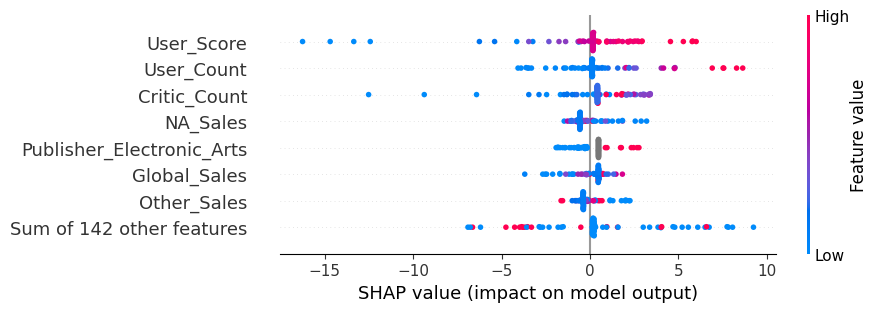

Racing_2005-2010_top_three_pca_sales


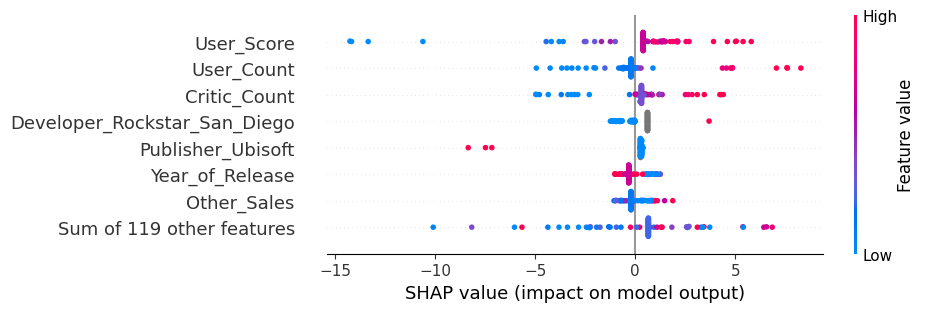

Racing_2010-2015_top_three_pca_sales


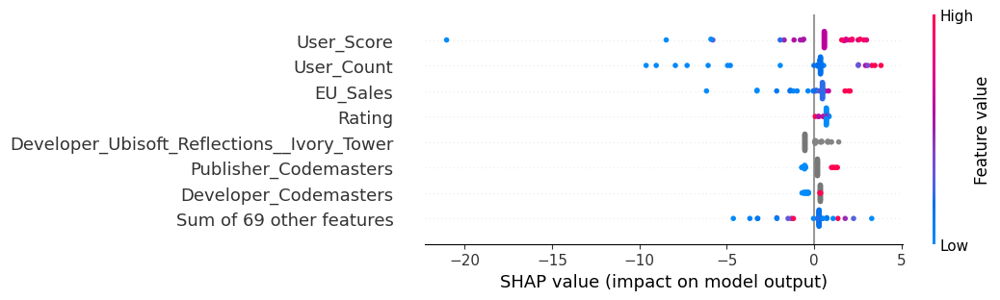

Racing_2015-2020_top_three_pca_sales


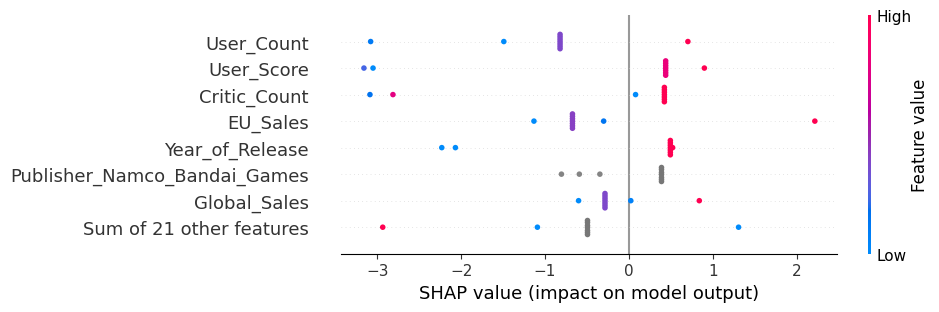

Shooter_2000-2016_top_three_pca_sales


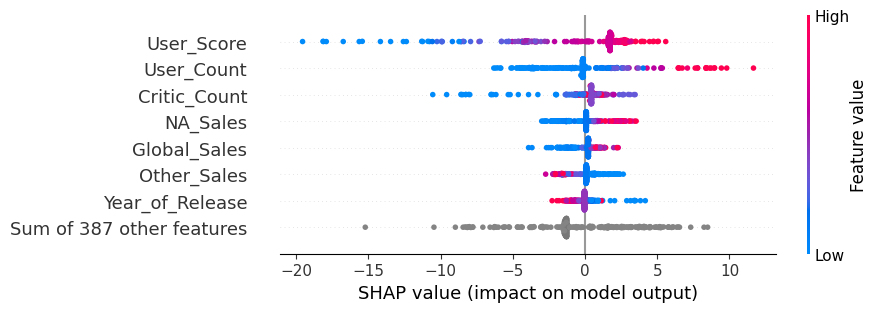

Shooter_2000-2005_top_three_pca_sales


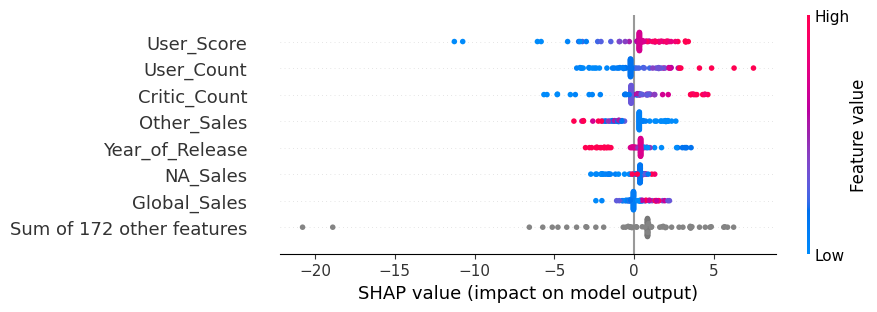

Shooter_2005-2010_top_three_pca_sales


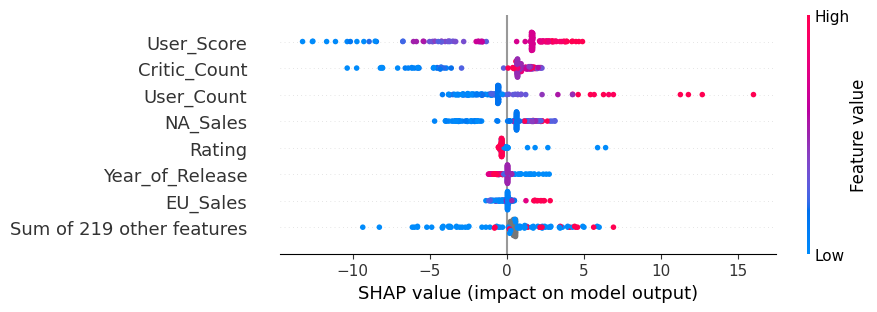

Shooter_2010-2015_top_three_pca_sales


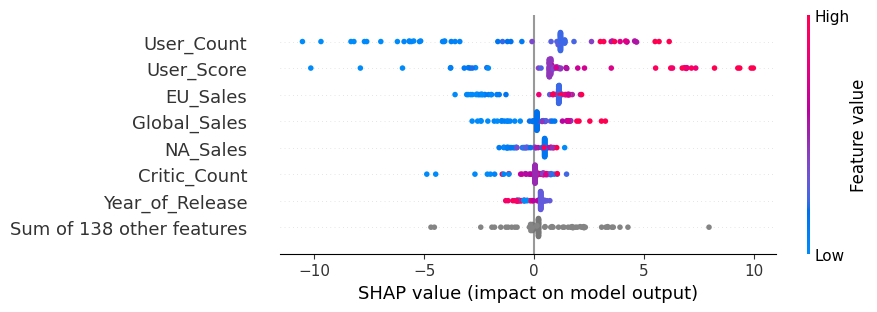

Shooter_2015-2020_top_three_pca_sales


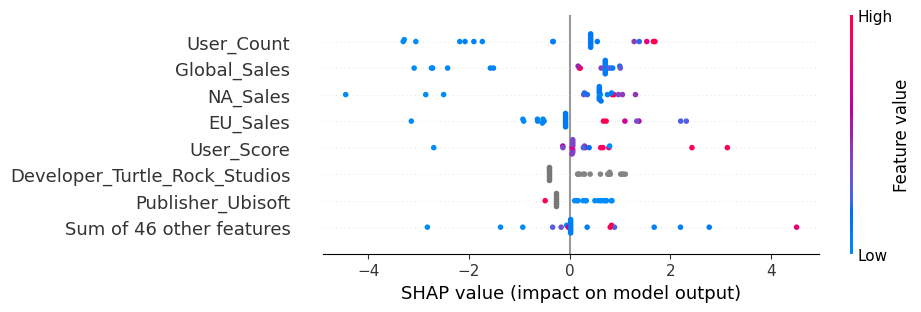

Misc_2000-2016_top_three_pca_sales


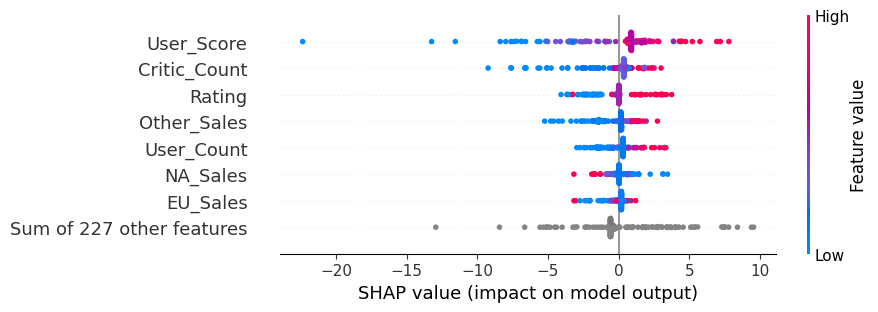

Misc_2000-2005_top_three_pca_sales


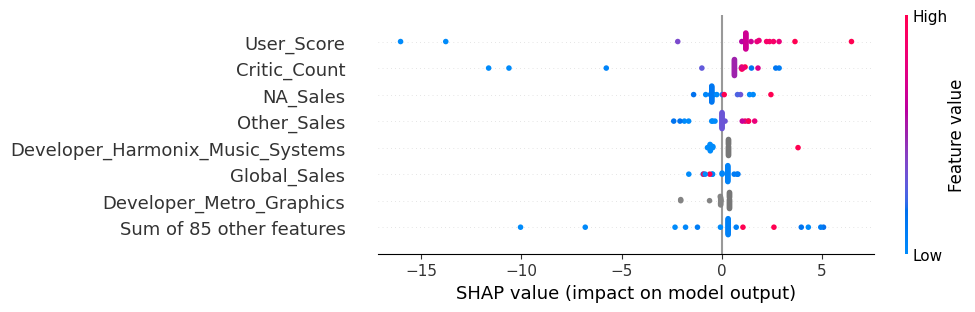

Misc_2005-2010_top_three_pca_sales


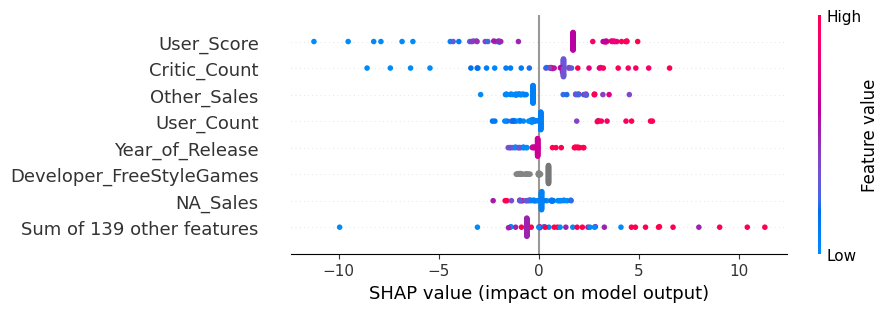

Misc_2010-2015_top_three_pca_sales


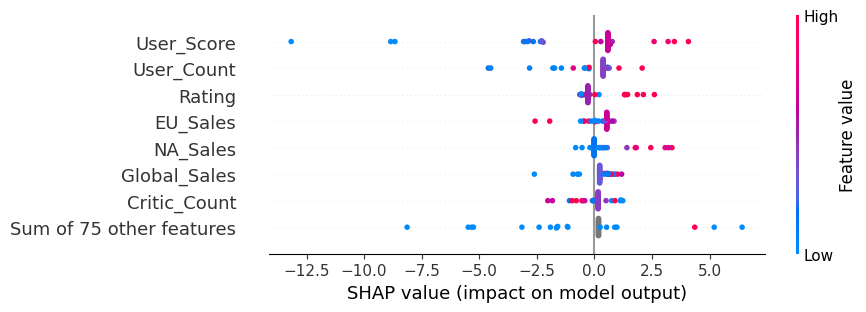

Misc_2015-2020_top_three_pca_sales


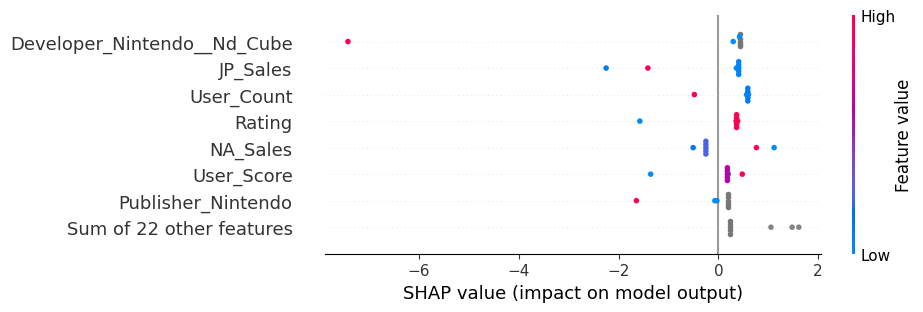

Platform_2000-2016_top_three_pca_sales


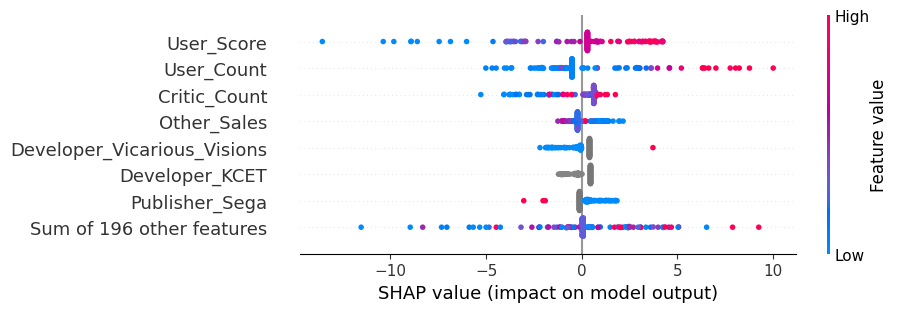

Platform_2000-2005_top_three_pca_sales


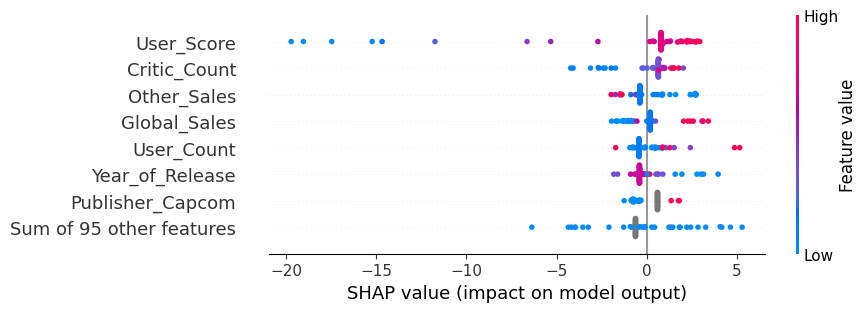

Platform_2005-2010_top_three_pca_sales


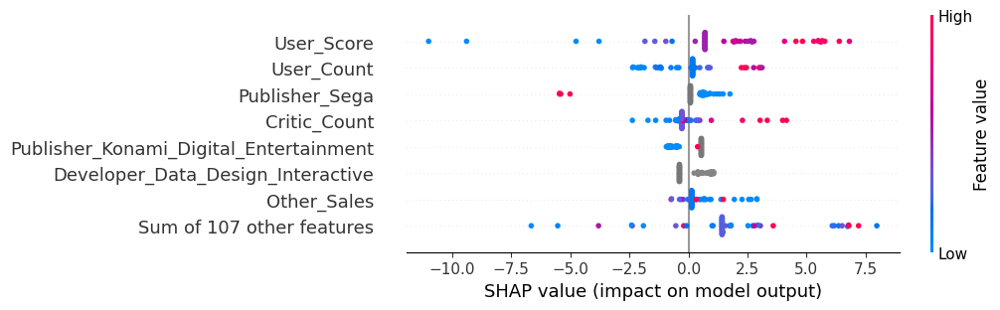

Platform_2010-2015_top_three_pca_sales


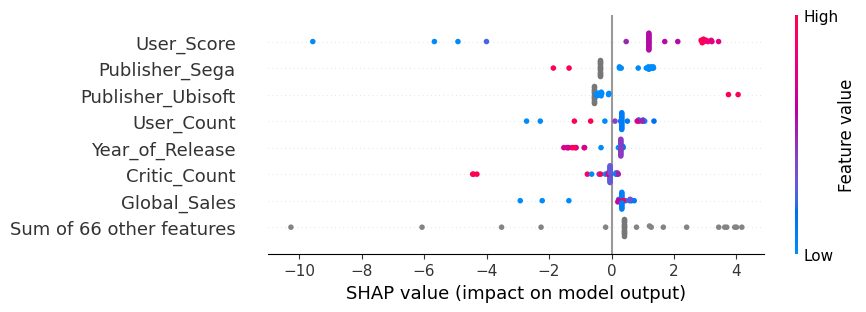

Platform_2015-2020_top_three_pca_sales


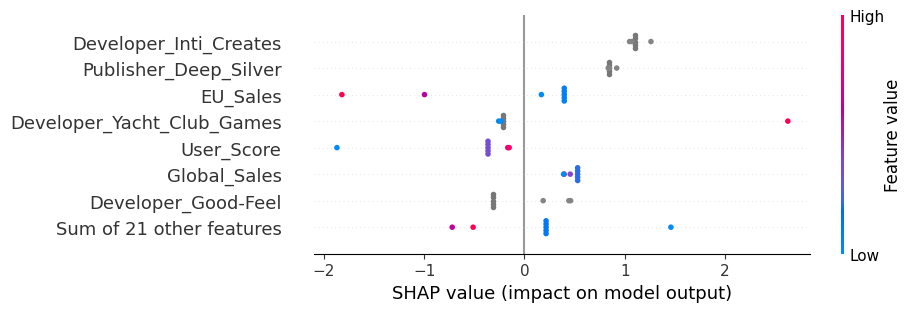

Strategy_2000-2016_top_three_pca_sales


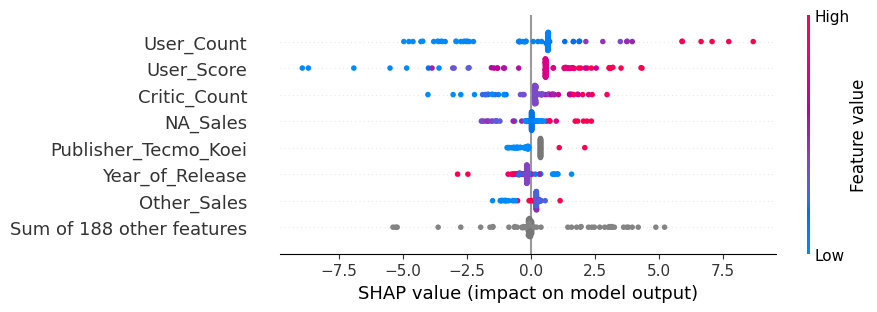

Strategy_2000-2005_top_three_pca_sales


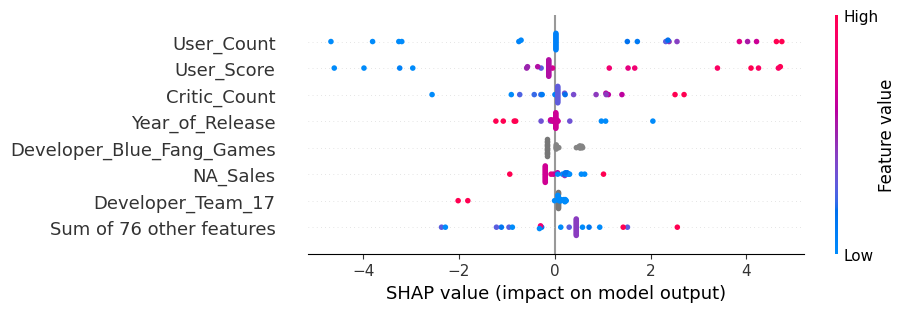

Strategy_2005-2010_top_three_pca_sales


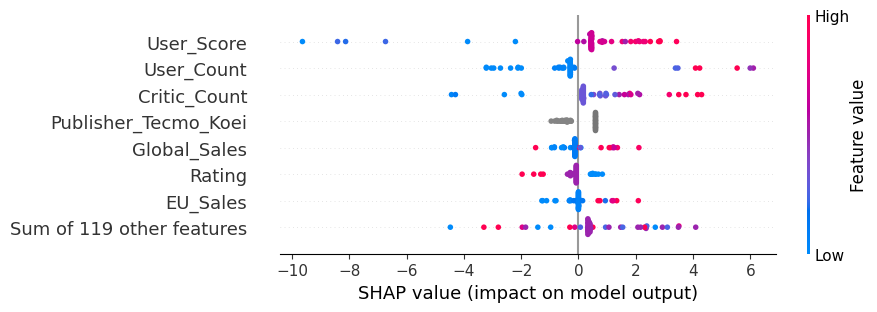

Strategy_2010-2015_top_three_pca_sales


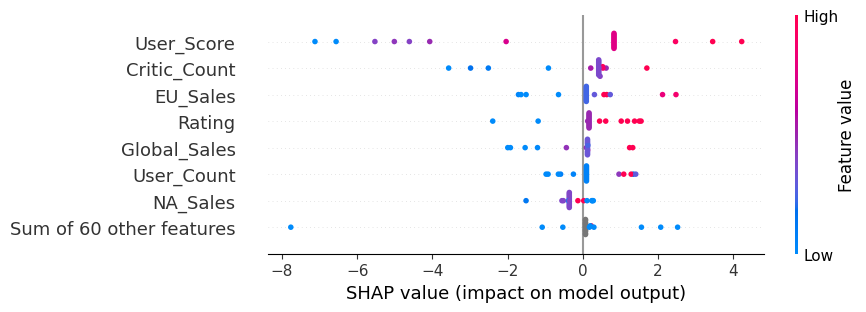

Strategy_2015-2020_top_three_pca_sales


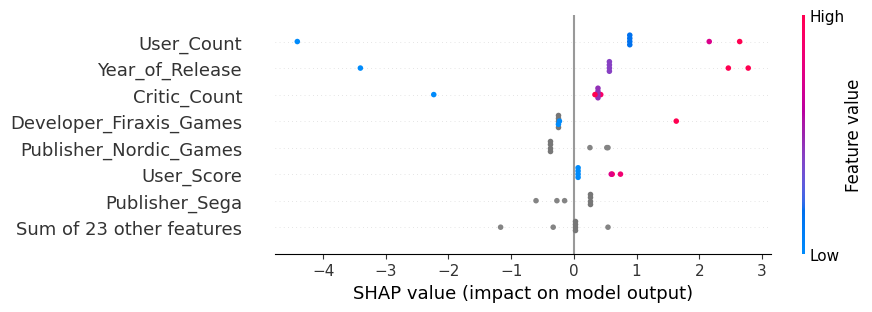

Action_2000-2016_top_three_pca_sales


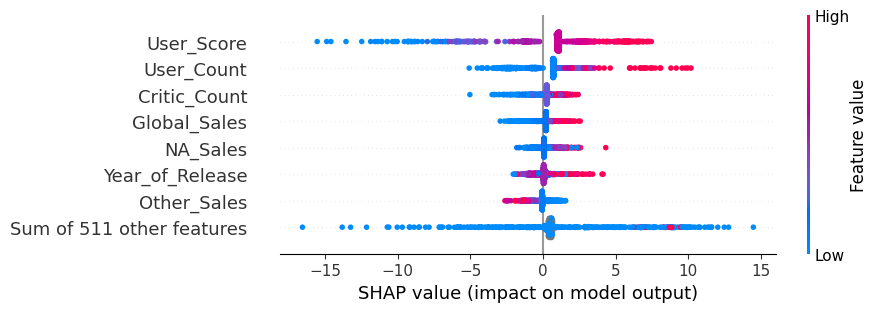

Action_2000-2005_top_three_pca_sales


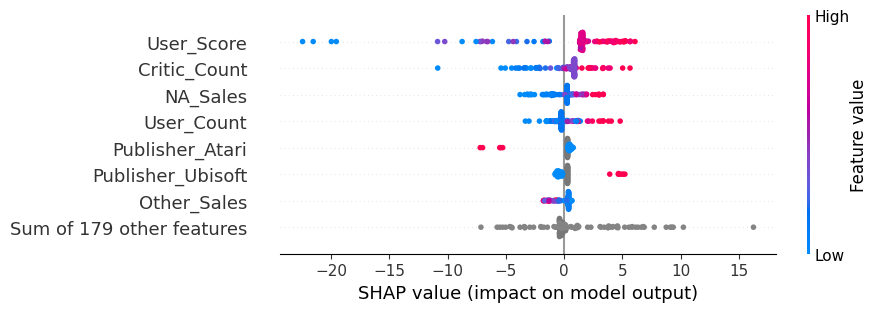

Action_2005-2010_top_three_pca_sales


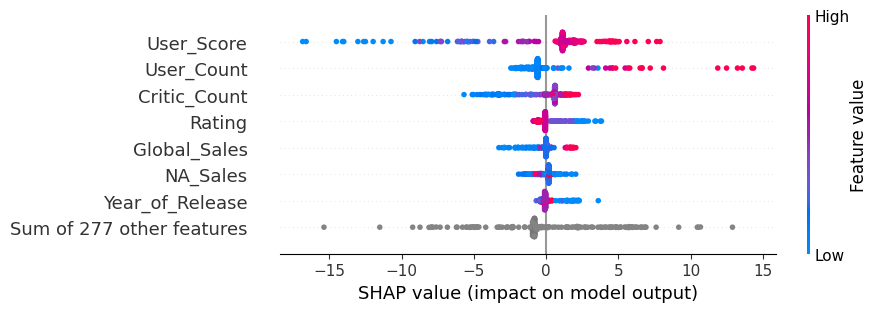

Action_2010-2015_top_three_pca_sales


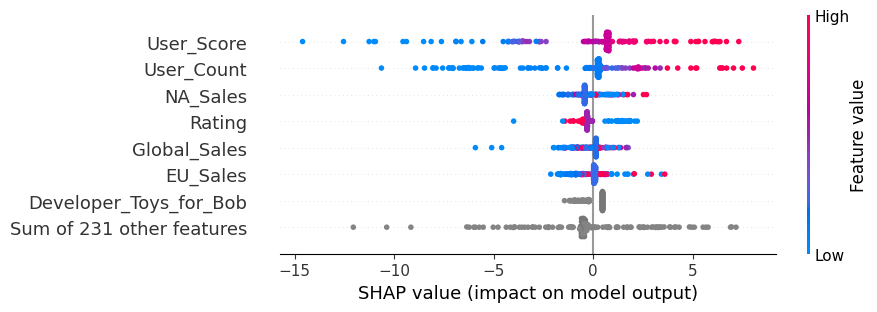

Action_2015-2020_top_three_pca_sales


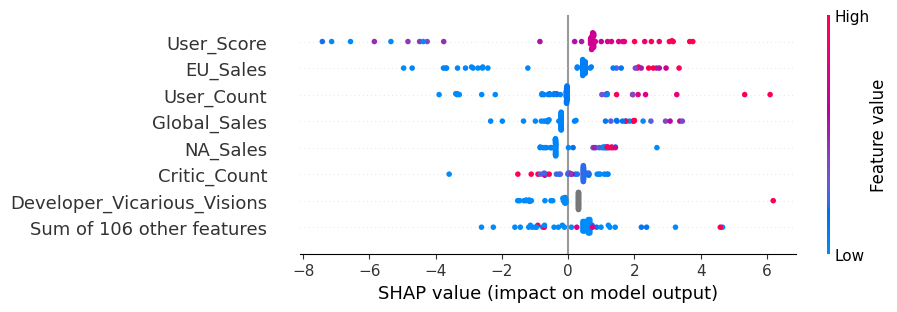

Puzzle_2000-2016_top_three_pca_sales


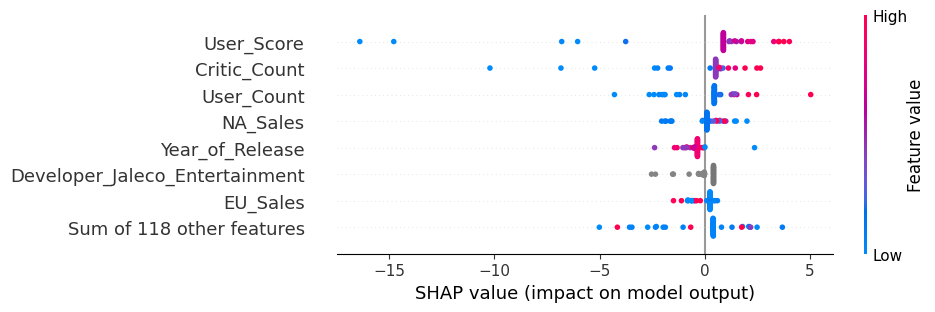

Puzzle_2000-2005_top_three_pca_sales


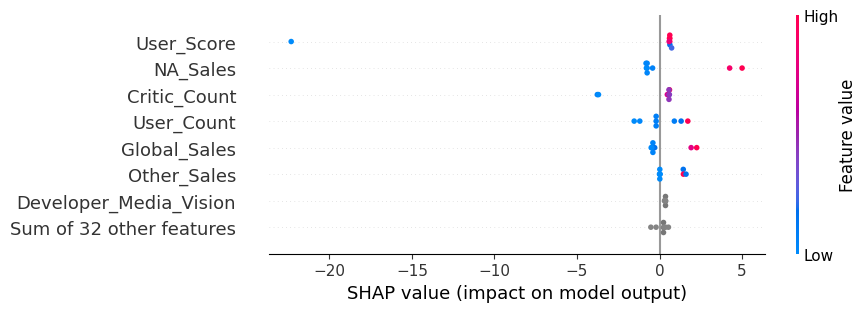

Puzzle_2005-2010_top_three_pca_sales


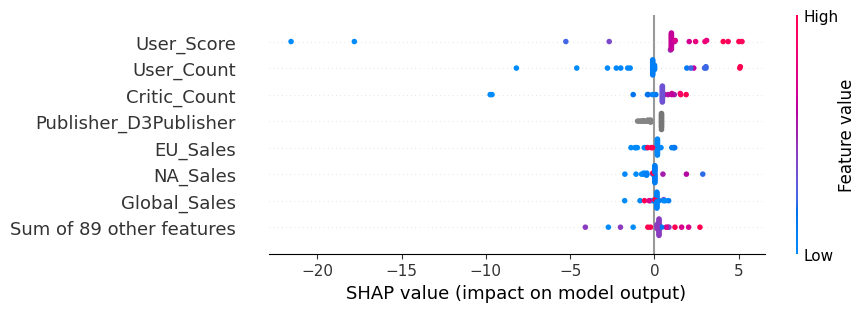

Puzzle_2010-2015_top_three_pca_sales


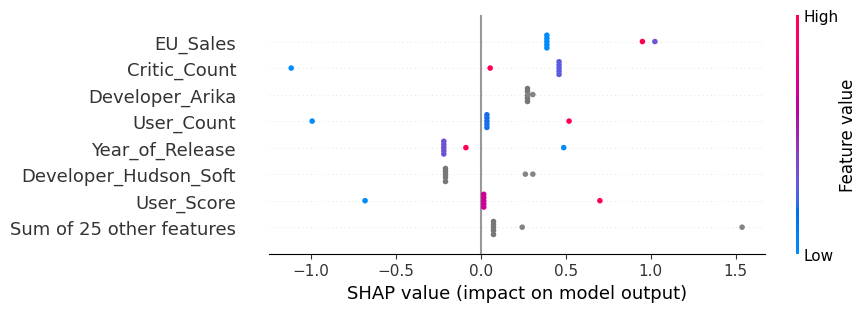

Puzzle_2015-2020_top_three_pca_sales


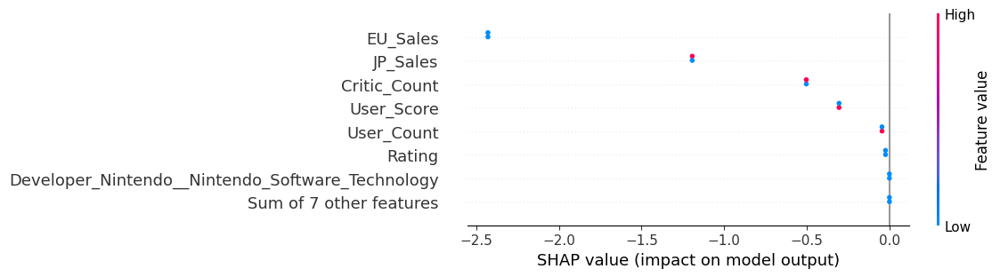

Adventure_2000-2016_top_three_pca_sales


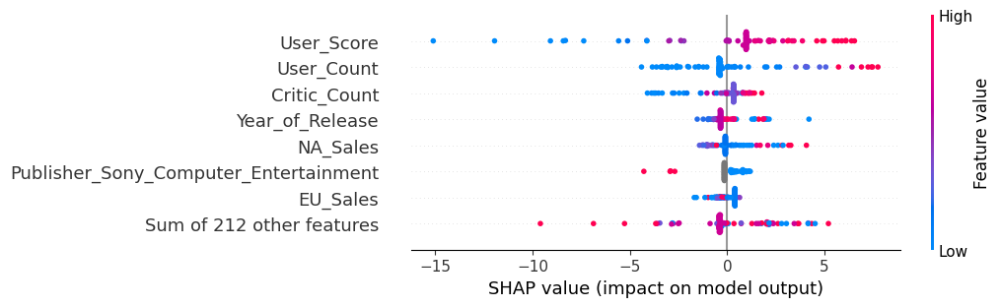

Adventure_2000-2005_top_three_pca_sales


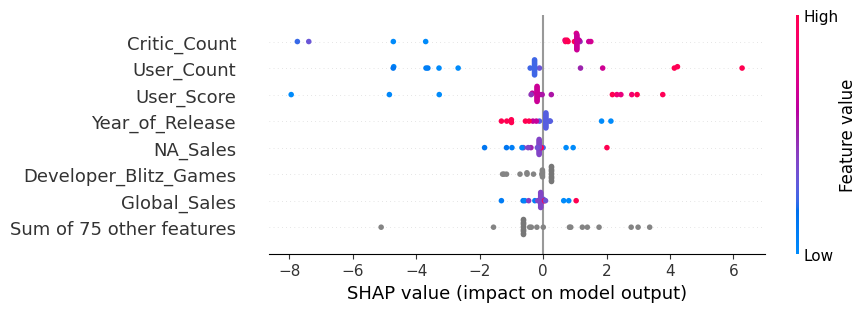

Adventure_2005-2010_top_three_pca_sales


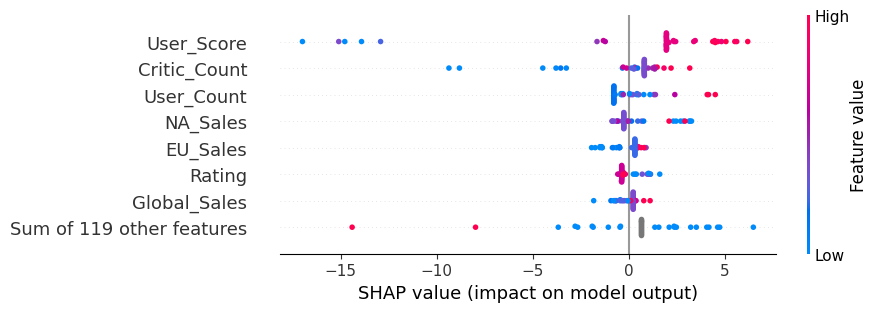

Adventure_2010-2015_top_three_pca_sales


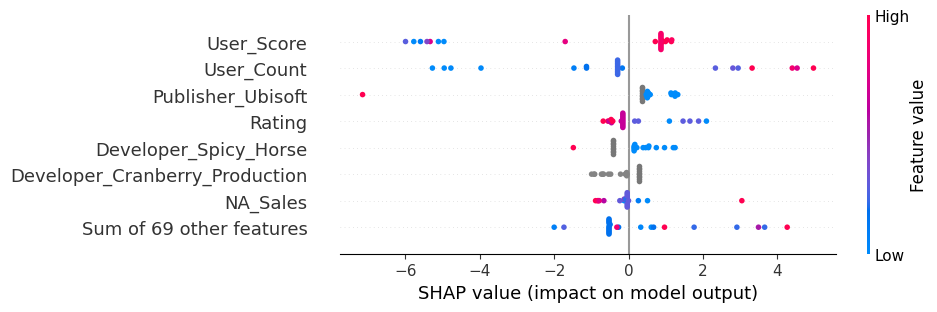

Adventure_2015-2020_top_three_pca_sales


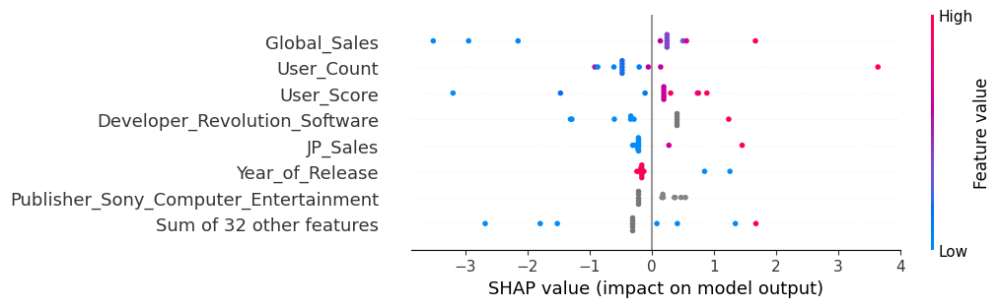

Simulation_2000-2016_top_three_pca_sales


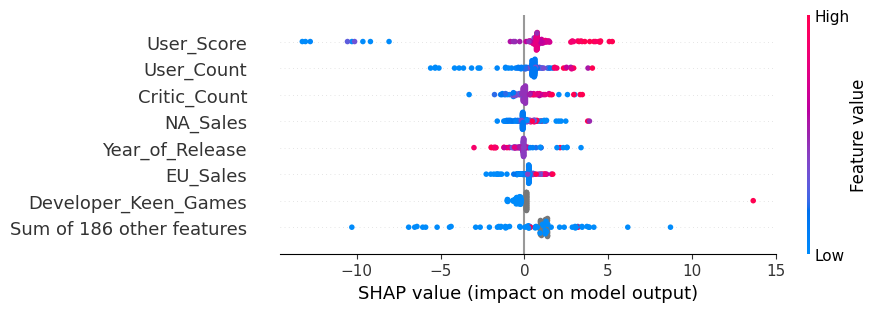

Simulation_2000-2005_top_three_pca_sales


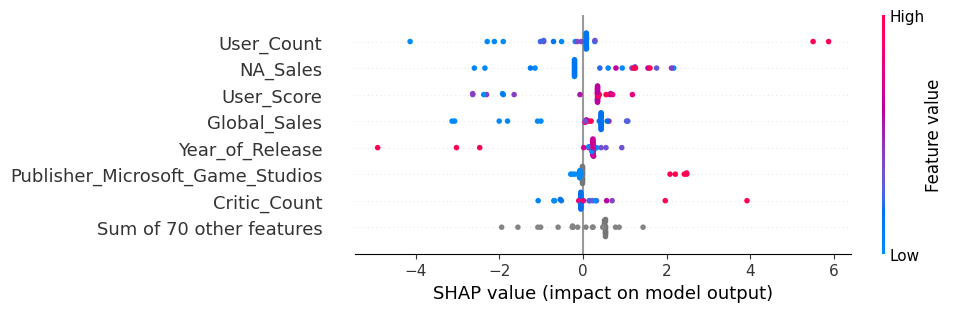

Simulation_2005-2010_top_three_pca_sales


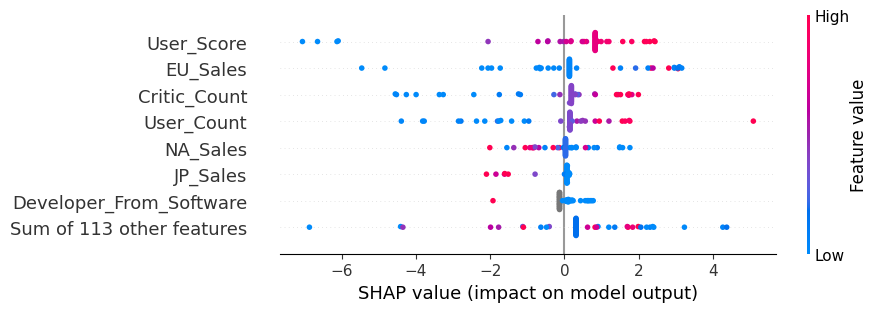

Simulation_2010-2015_top_three_pca_sales


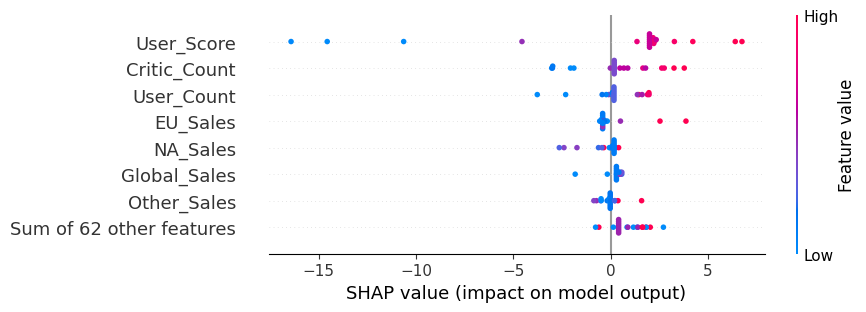

Simulation_2015-2020_top_three_pca_sales


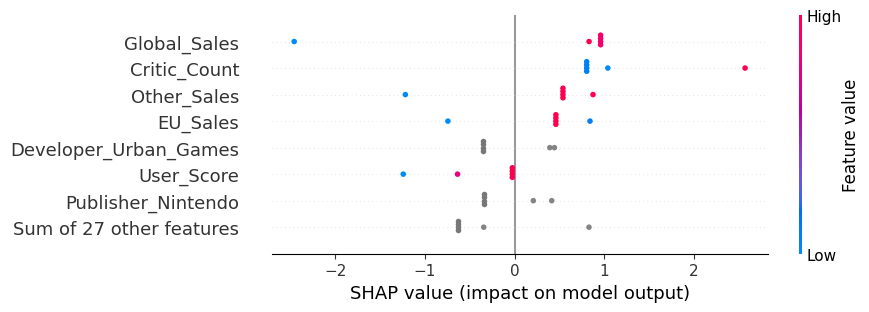

All_Genres_2000-2016_top_three_pca_sales


 99%|===================| 2599/2634 [00:48<00:00]       

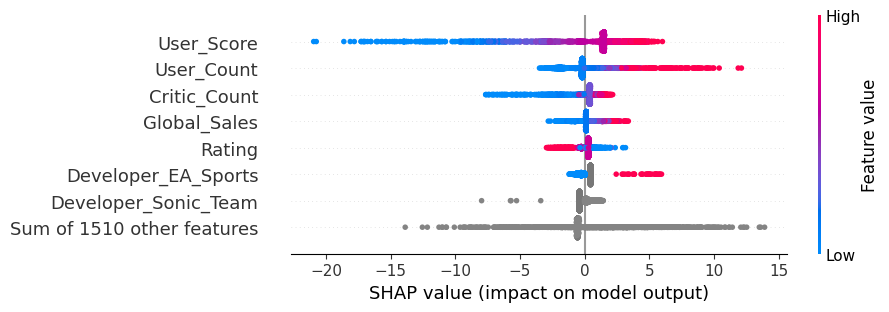

All_Genres_2000-2005_top_three_pca_sales


 98%|===================| 701/716 [00:14<00:00]       

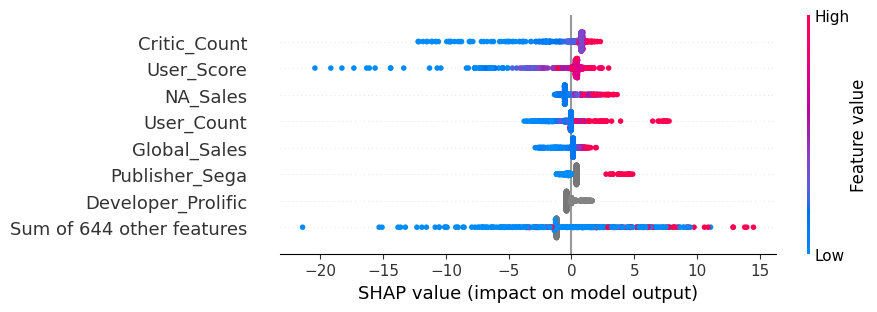

All_Genres_2005-2010_top_three_pca_sales


 99%|===================| 1118/1132 [00:17<00:00]       

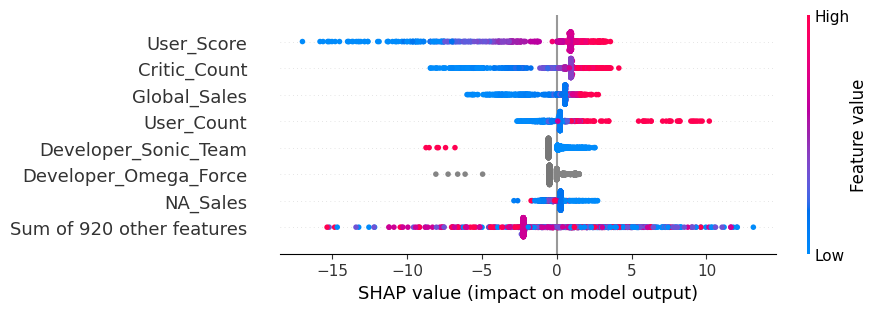

All_Genres_2010-2015_top_three_pca_sales


 94%|=================== | 659/699 [00:11<00:00]       

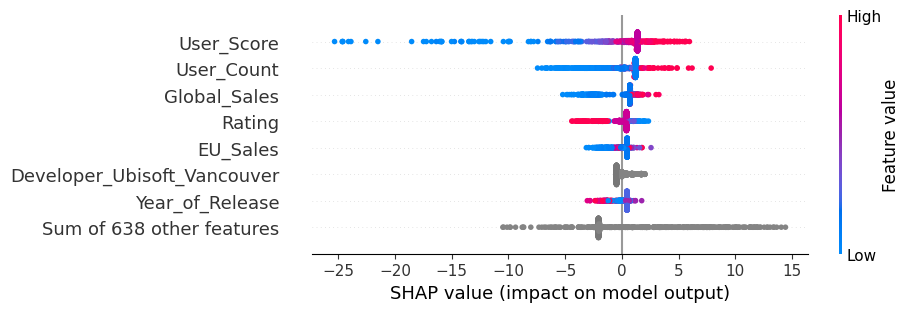

All_Genres_2015-2020_top_three_pca_sales


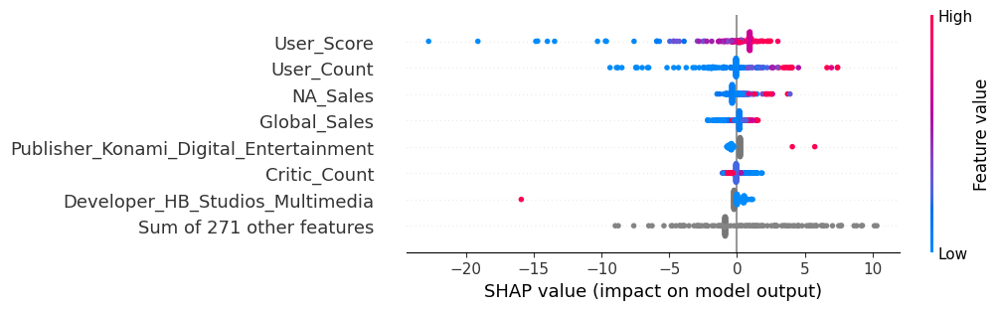

In [11]:
import shap
import matplotlib.pyplot as plt

for model_data in MODELS:
    genre, model, X_train, X_test, y_train, y_test, y_pred = model_data['modele_data']
    name = model_data['name']
    if name[0] != 'top_three_pca_sales':
        continue


    # Calculate SHAP values
    print(f"\033[1m{genre}_{name[1]}_{name[0]}\033[0m")

    explainer = shap.Explainer(model, X_train)
    shap_values = explainer(X_test)

    # Set the figure size using matplotlib before SHAP plot
    shap.plots.beeswarm(shap_values, max_display=8, plot_size=0.2)




We can observe from the feature selection process that while the most important features remain generally consistent across the datasets, **their rankings differ depending on the genre and the year of release. This supports our claim that the data behaves differently when segmented by these factors.**

The approach of splitting the dataset by genre and year of release and then analyzing feature importance for each subset highlights that feature importance varies significantly across these splits. This is a critical insight, as attempting to train a model on the entire dataset without considering these differences would likely result in difficulty improving the model's performance, especially given the limited sample size.

**Moreover**, We can also observe that the impact of features varies across different genres and years. For example, in the genre 'Role_Play', during the years 2010–2015, the most important feature is User_Count, with a SHAP value less than 0. However, in the same genre, outside this time frame, User_Count remains the most important feature, but its SHAP value becomes greater than 0.

This demonstrates how differently the data behaves across these periods, highlighting the importance of considering temporal and genre-specific variations in feature impact.

By examining these tables, we learn that each subset of the data requires a tailored approach to leverage the unique behavior of the features within that group. This insight underscores the importance of stratifying the data based on key attributes, such as genre and release year, to enhance model performance and extract meaningful patterns.

# **B. Predicted vs Actual Price**
The "Predicted vs Actual Price" plot is important for error analysis as it visually shows how closely the model’s predictions align with actual values. It helps identify systematic errors and assess model accuracy by how close the points are to the red dashed line. This enables the identification of areas where the model performs poorly and highlights specific weaknesses for improvement.

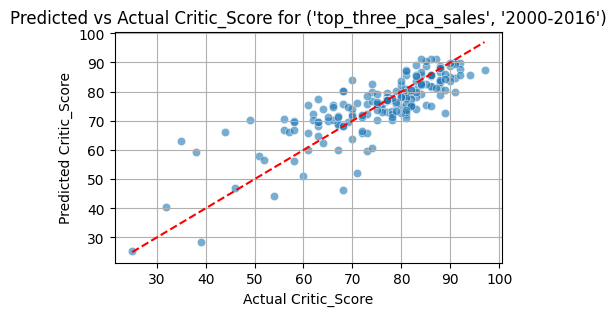

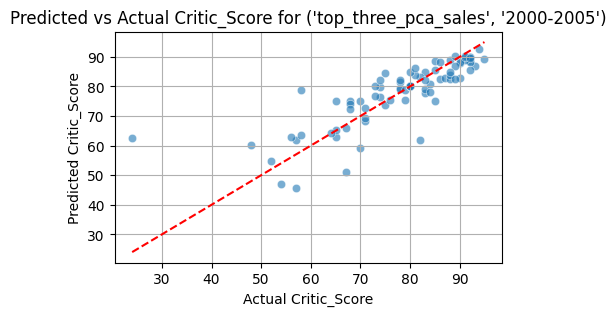

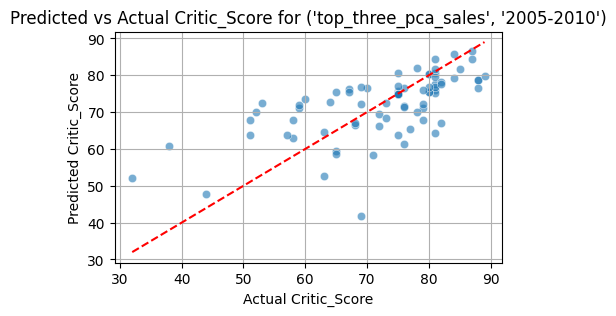

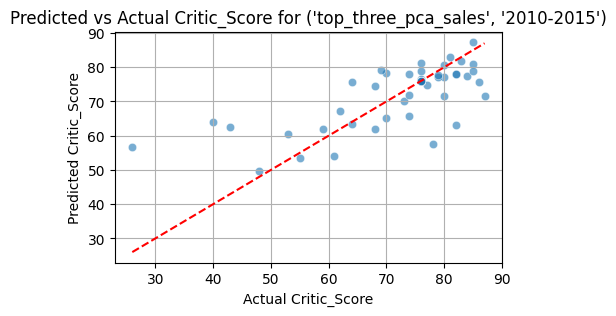

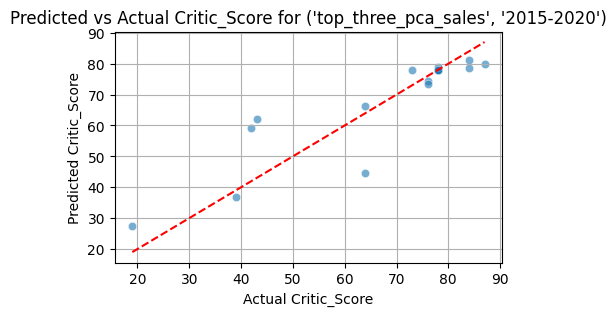

...

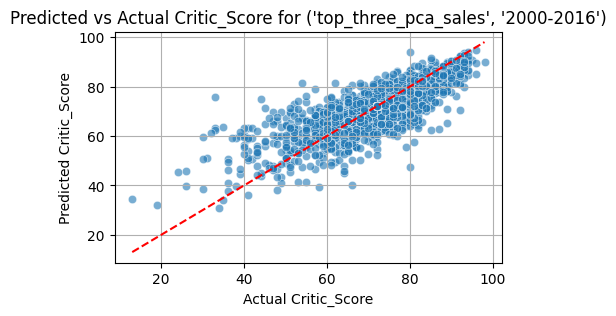

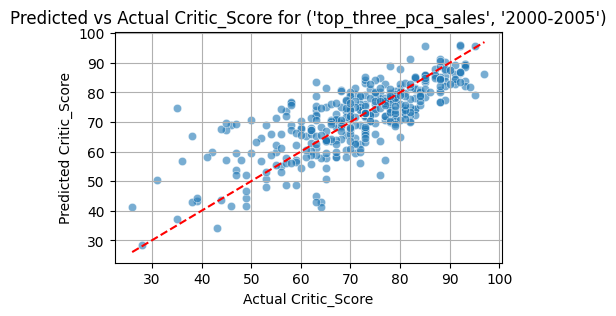

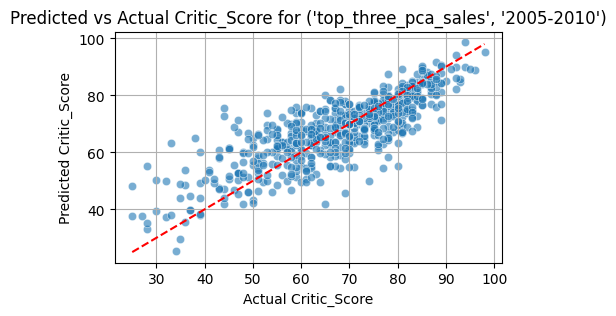

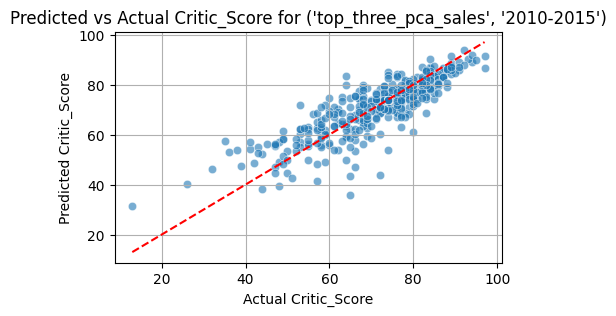

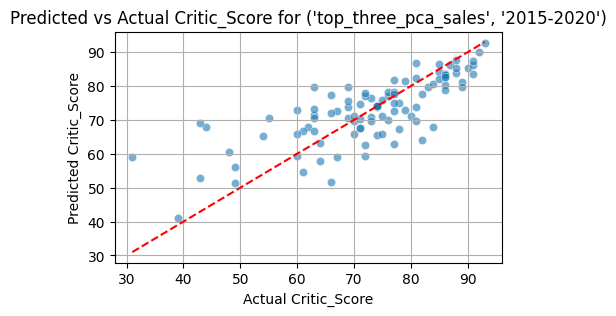

In [12]:
# Plot Predicted vs Actual
for model_data in MODELS:
  genre, model, X_train, X_test, y_train, y_test, y_pred = model_data['modele_data']
  name = model_data['name']
  if name[0] != 'top_three_pca_sales':
    continue
  plt.figure(figsize=(5, 3))
  sns.scatterplot(x=y_test, y=y_pred, alpha=0.6)
  sns.lineplot(x=[y_test.min(), y_test.max()], y=[y_test.min(), y_test.max()], color='red', linestyle='--')
  plt.title(f"Predicted vs Actual Critic_Score for {name}")
  plt.xlabel("Actual Critic_Score")
  plt.ylabel("Predicted Critic_Score")
  plt.grid(True)
  plt.show()

# **Insights**
Like in Our Last Work:
The red line represents the linear regression line (best-fit line), and the points generally following the same direction suggest a linear relationship between the input features and the target output.

Previously, the points were widely spread around the line, indicating high variance or a low R² value, meaning the model was not capturing all the variability in the data. However, since the points were evenly distributed above and below the line, the model's errors (residuals) were random, which suggested that the model was still appropriate despite its limitations.

Outliers were observed as points far from the line, potentially impacting the model's fit. Handling these outliers was an area for improvement.

Now, in this iteration, we observe that the points are more tightly clustered around the line in most cases. This suggests that our model has improved significantly, capturing more of the variability in the data while maintaining random residual distribution. This improvement demonstrates progress in reducing errors and enhancing the model's performance.

# **C. Overestimations and Underestimations by Price**

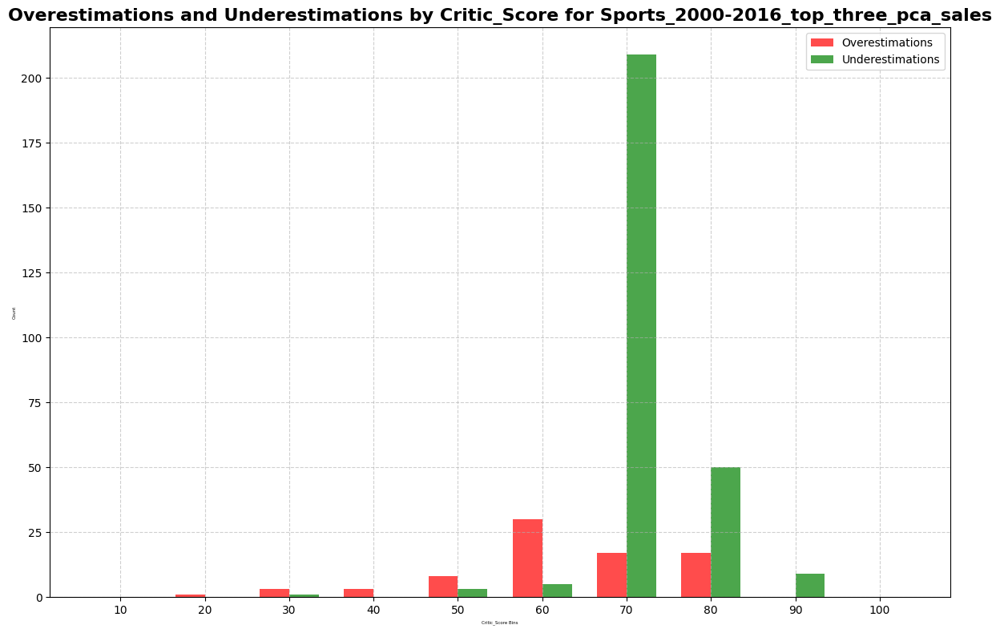

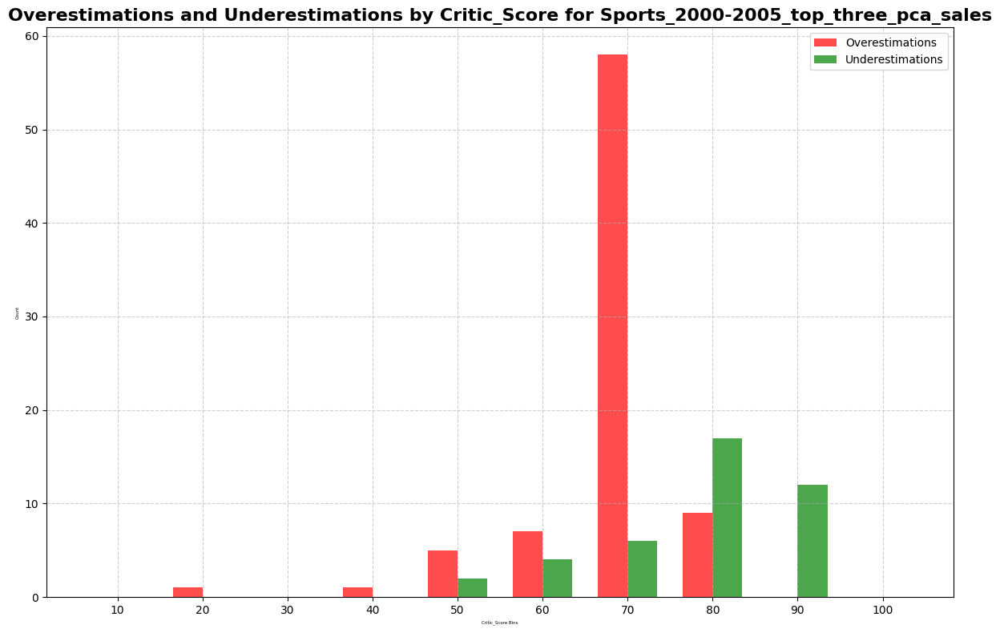

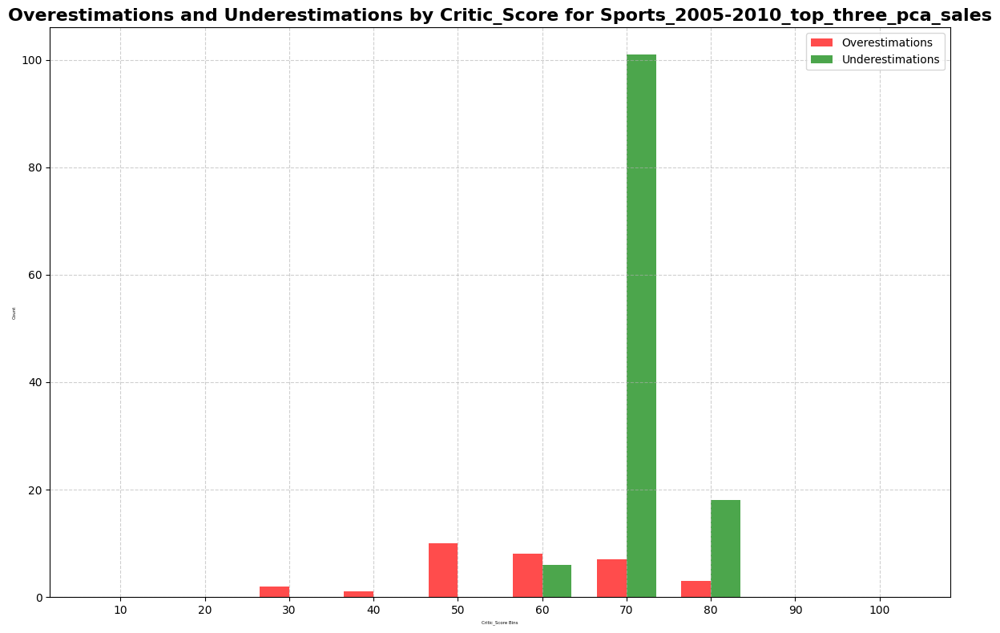

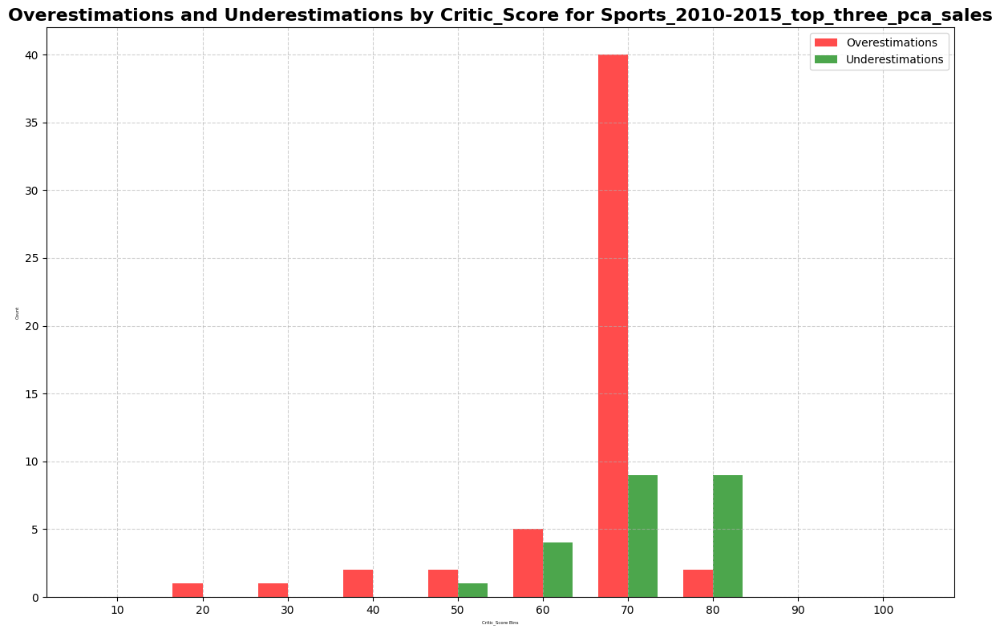

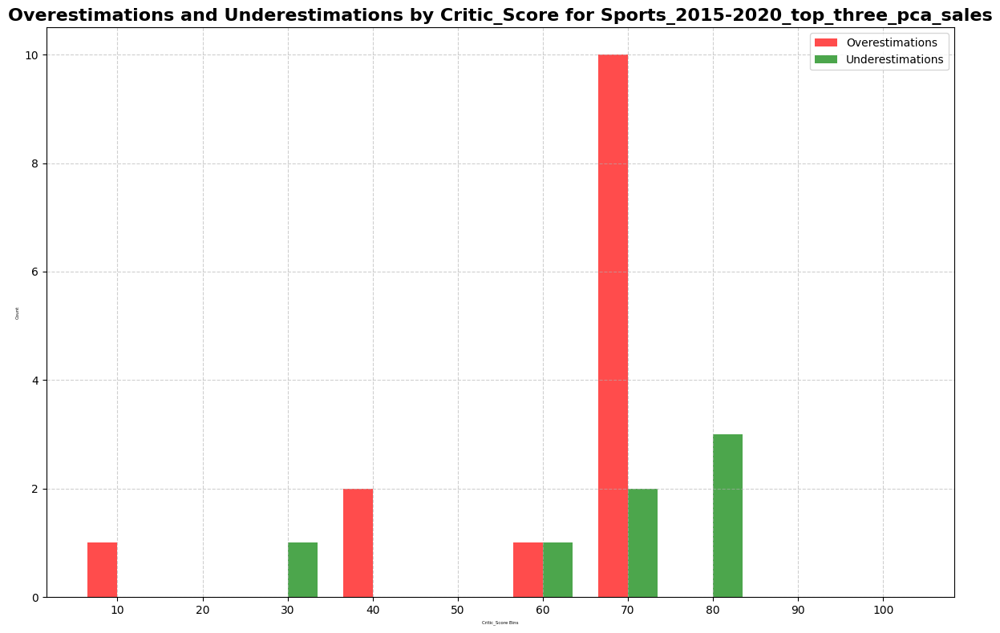

...

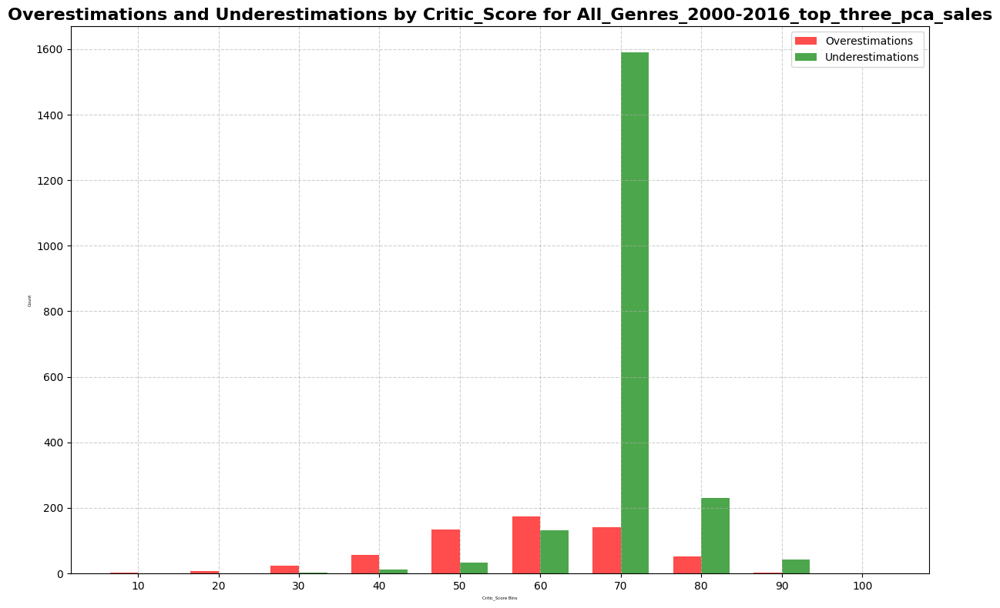

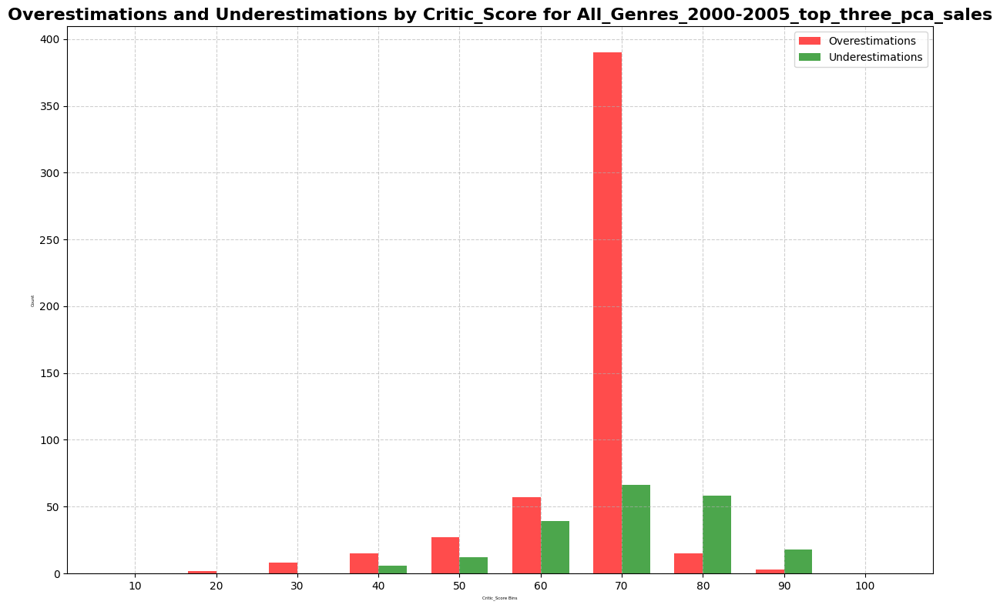

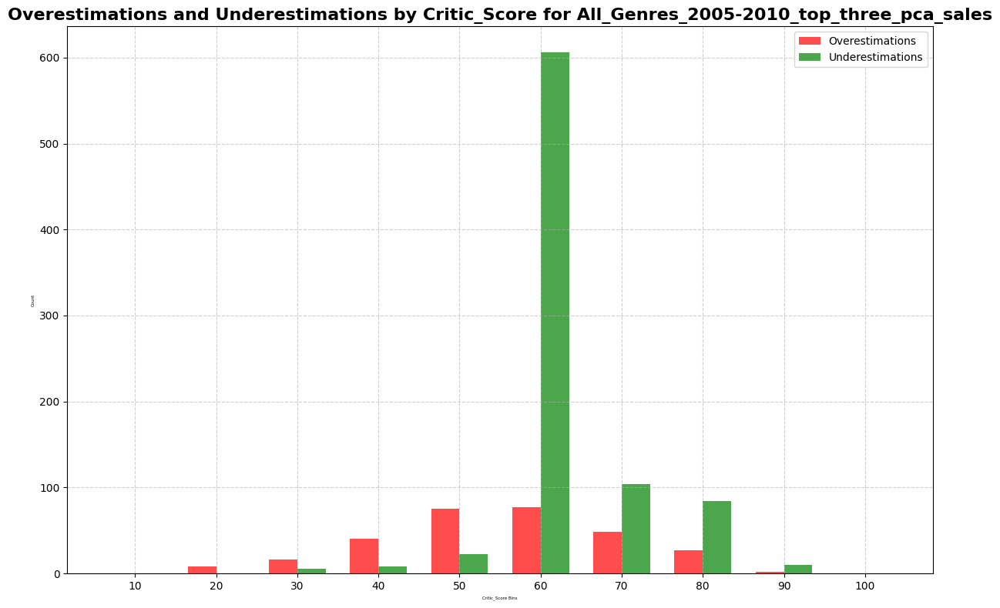

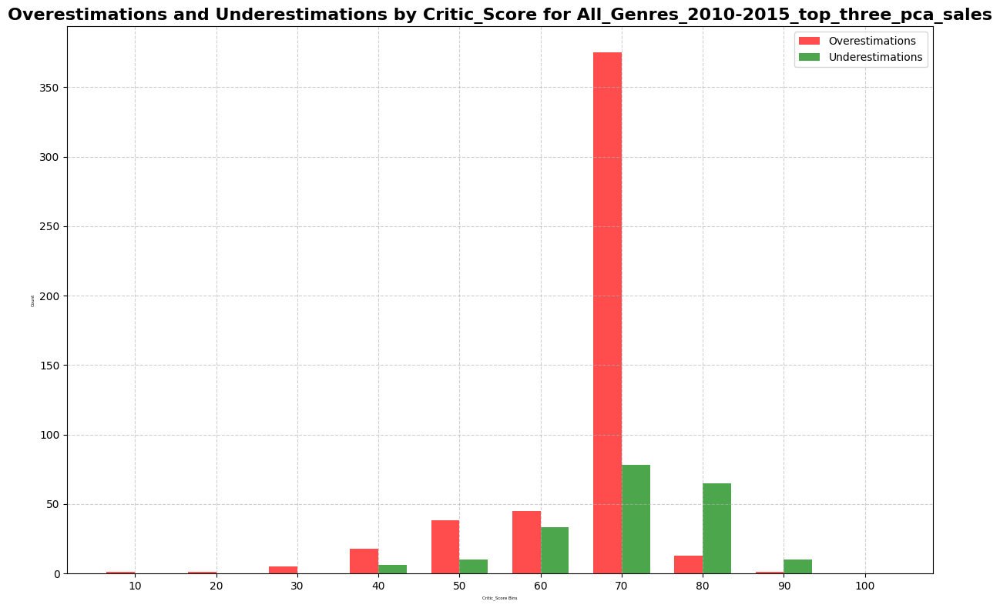

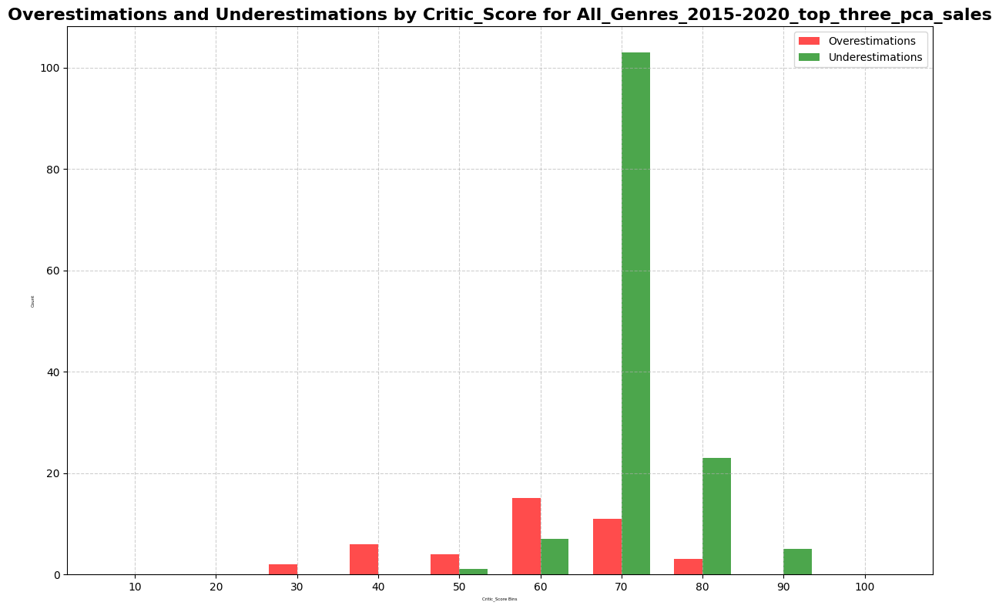

In [13]:
for model_data in MODELS:
  genre, model, X_train, X_test, y_train, y_test, y_pred = model_data['modele_data']
  name = model_data['name']
  if name[0] != 'top_three_pca_sales':
    continue
  # Define bins for price ranges
  price_bins = [int(x * 10) for x in range(1, 12)]
  price_labels = [str(x * 10) for x in range(1, 11)]
  y_test_binned = pd.cut(y_test, bins=price_bins, labels=price_labels)
  residuals = y_test - y_pred
  # Create a DataFrame for analysis
  analysis_df = pd.DataFrame({
      'Actual Price': y_test,
      'Predicted Price': y_pred,
      'Residual': residuals,
      'Critic_Score Range': y_test_binned
  })

  # Calculate overestimations and underestimations by price range
  over_under_estimations = analysis_df.groupby('Critic_Score Range').apply(
      lambda group: pd.Series({
          'Overestimations': (group['Residual'] < 0).sum(),
          'Underestimations': (group['Residual'] > 0).sum()
      })
  ).reset_index()

  # Plot overestimations and underestimations by price range
  plt.figure(figsize=(12, 8))
  bar_width = 0.35
  index = np.arange(len(over_under_estimations))

  plt.bar(index, over_under_estimations['Overestimations'], bar_width, label='Overestimations', color='red', alpha=0.7)
  plt.bar(index + bar_width, over_under_estimations['Underestimations'], bar_width, label='Underestimations', color='green', alpha=0.7)

  plt.ylabel('Count', fontsize=4)
  plt.xlabel('Critic_Score Bins', fontsize=4)
  model_name = f'{genre}_{name[1]}_{name[0]}'
  title = f'Overestimations and Underestimations by Critic_Score for {model_name}'
  plt.title(title, fontsize=16, fontweight='bold')
  plt.xticks(index + bar_width / 2, over_under_estimations['Critic_Score Range'])
  plt.legend()
  plt.grid(True, linestyle='--', alpha=0.6)
  plt.tight_layout()
  plt.show()

In this plot, we can analyze the underestimation and overestimation behavior of the model. For values around the extremes, our model seems to perform better, but for the values in the middle, it still tends to either overestimate or underestimate.

This issue is likely not due to overfitting, as the model's performance on the test set has improved. Instead, the target variable appears to be imbalanced, with fewer examples in the middle range compared to the extremes. As a result, the model struggles to learn the patterns for middle values effectively.

Ironically, it seems that the middle values act like outliers. This is probably not true in reality, but the distribution of our data gives this impression.

To address this issue, we need more samples in the middle range to help the model learn these patterns properly. Alternatively, we need to investigate whether the middle values are genuinely outliers and, if so, handle them appropriately.

# **Summary**
In our previous work, we built a model to predict critic scores for PC/PS games using features like sales, developer, and user scores. This work refines the model by focusing on better data handling and parameter tuning.

Key Findings:
Year and Genre Effects:

1. Scores before 2000 were inconsistent; post-2000, they stabilized due to technological advances. We excluded pre-2000 data to focus on modern games.
Genre-specific differences prompted us to create separate models for each genre, improving accuracy.
Insights on Data Behavior:

2. Critic scores showed strong patterns influenced by genre and release year. Features like User_Count were highly important but varied in impact based on time periods and genres.
Middle-range critic scores behaved like outliers due to data imbalance, even though they are likely representative. This imbalance made the model struggle to predict these values accurately.
Feature Simplification:

3. Sales features were combined into a single feature, simplifying data and improving pattern recognition.
Performance Challenges:

4. While some genres showed significant improvement, others were inconsistent, underlining the importance of more balanced and representative data.


# **Real-World Use:**
This model can assist game production companies in predicting the critic score their game might receive. Additionally, when deciding which game to develop, they can input potential values into the model to evaluate whether the project aligns with their goals and expectations.